In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Fase 3 da pós em engenharia de machine learning

O objetivo dessa fase é realizar dois modelos, um supervisionado e outro não-supervisionada usando para isso a base de cancelamento e atraso de voos nos EUA.

# Usaremos:

## Modelos de classificação supervisionada
- **XGBoost (XGBClassifier):** treino com early stopping, avaliação por ROC‑AUC e Average Precision, CV estratificado e otimização de threshold via F1.  
- **LightGBM (LGBMClassifier):** treino com early stopping, CV e importância por "gain".  
- **RandomForestClassifier:** baseline/ensemble, ajuste de class_weight e comparação com XGBoost/LGBM.  

## Modelos e métodos não supervisionados / análises exploratórias
- **KMeans:** clusterização (K selecionado via Silhouette, K=4), PCA para visualização 2D e interpretação de perfis de cluster.  
- **PCA:** redução de dimensionalidade para plotagem e análise.  
- **IsolationForest:** detecção de anomalias em features selecionadas.  

## Técnicas de pré‑processamento e engenharia de features
- Remoção de features com potencial data leakage (variáveis pós‑voo).  
- Label encoding.  
- Preenchimento de nulos por mediana.  
- Criação de variáveis derivadas (HOUR → PERIOD_OF_DAY, MONTH → SEASON).  
- Agregações por rota/estado.  

## Avaliação e visualizações
- **Métricas:** classification_report, ROC‑AUC, Average Precision, cross‑val scores.  
- Curvas ROC/PR.  
- Matrizes de confusão.  
- Otimização de threshold.  
- Importância de features (gain/importance).  
- **Visualizações geográficas:** merge com airports.csv para lat/lon e mapas interativos (Folium) das rotas com maior atraso (filtragem por mínimo de voos).  

## Pontos extras implementados
- Criação de variáveis derivadas (PERIOD_OF_DAY, SEASON).  
- Análise de atrasos por estado (merge com airports e ranking top‑10).  
- Preparação e visualização de mapas interativos (Folium) para as rotas mais atrasadas (Top10).  
- Detecção de anomalias com IsolationForest e inspeção dos scores.  
- Análise de sensibilidade para K no KMeans (Silhouette de 2 a 10) e escolha de K=4.  
- **Recomendações:** aplicar SHAP/LIME para interpretabilidade, tunar hiperparâmetros (Grid/Random/Optuna), testar balanceamento (SMOTE/ADASYN) e outros algoritmos de clusterização (DBSCAN, GMM).  


## Bibliotecas

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score,
    roc_curve, precision_recall_curve, average_precision_score,
    ConfusionMatrixDisplay
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb
import warnings
warnings.filterwarnings("ignore")



XGBoostError: 
XGBoost Library (libxgboost.dylib) could not be loaded.
Likely causes:
  * OpenMP runtime is not installed
    - vcomp140.dll or libgomp-1.dll for Windows
    - libomp.dylib for Mac OSX
    - libgomp.so for Linux and other UNIX-like OSes
    Mac OSX users: Run `brew install libomp` to install OpenMP runtime.

  * You are running 32-bit Python on a 64-bit OS

Error message(s): ["dlopen(/Users/vagnerantononiodasilva/Documents/projetos/.venv/lib/python3.13/site-packages/xgboost/lib/libxgboost.dylib, 0x0006): Library not loaded: @rpath/libomp.dylib\n  Referenced from: <1A0D8152-BF46-3BE0-B651-EE965C187777> /Users/vagnerantononiodasilva/Documents/projetos/.venv/lib/python3.13/site-packages/xgboost/lib/libxgboost.dylib\n  Reason: tried: '/opt/homebrew/opt/libomp/lib/libomp.dylib' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/opt/homebrew/opt/libomp/lib/libomp.dylib' (no such file), '/opt/homebrew/opt/libomp/lib/libomp.dylib' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/opt/homebrew/opt/libomp/lib/libomp.dylib' (no such file)"]


## Carregamento das bases

In [ ]:
try:
    airlines = pd.read_csv('./drive/MyDrive/POSFIAP/airlines.csv')
    print("CSV file loaded successfully!")
    print(airlines.head())
except FileNotFoundError:
    print("Error: The file '/airlines.csv' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

CSV file loaded successfully!
  IATA_CODE                 AIRLINE
0        UA   United Air Lines Inc.
1        AA  American Airlines Inc.
2        US         US Airways Inc.
3        F9  Frontier Airlines Inc.
4        B6         JetBlue Airways


In [ ]:
try:
    airports = pd.read_csv('./drive/MyDrive/POSFIAP/airports.csv')
    print("CSV file loaded successfully!")
    print(airports.head())
except FileNotFoundError:
    print("Error: The file '/airports.csv' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

CSV file loaded successfully!
  IATA_CODE                              AIRPORT         CITY STATE COUNTRY  \
0       ABE  Lehigh Valley International Airport    Allentown    PA     USA   
1       ABI             Abilene Regional Airport      Abilene    TX     USA   
2       ABQ    Albuquerque International Sunport  Albuquerque    NM     USA   
3       ABR            Aberdeen Regional Airport     Aberdeen    SD     USA   
4       ABY   Southwest Georgia Regional Airport       Albany    GA     USA   

   LATITUDE  LONGITUDE  
0  40.65236  -75.44040  
1  32.41132  -99.68190  
2  35.04022 -106.60919  
3  45.44906  -98.42183  
4  31.53552  -84.19447  


In [ ]:
try:
    flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv')
    print("CSV file loaded successfully!")
    print(flights.head())
except FileNotFoundError:
    print("Error: The file '/flights.csv' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

CSV file loaded successfully!
   YEAR  MONTH  DAY  DAY_OF_WEEK AIRLINE  FLIGHT_NUMBER TAIL_NUMBER  \
0  2015      1    1            4      AS             98      N407AS   
1  2015      1    1            4      AA           2336      N3KUAA   
2  2015      1    1            4      US            840      N171US   
3  2015      1    1            4      AA            258      N3HYAA   
4  2015      1    1            4      AS            135      N527AS   

  ORIGIN_AIRPORT DESTINATION_AIRPORT  SCHEDULED_DEPARTURE  ...  ARRIVAL_TIME  \
0            ANC                 SEA                    5  ...         408.0   
1            LAX                 PBI                   10  ...         741.0   
2            SFO                 CLT                   20  ...         811.0   
3            LAX                 MIA                   20  ...         756.0   
4            SEA                 ANC                   25  ...         259.0   

   ARRIVAL_DELAY  DIVERTED  CANCELLED  CANCELLATION_REASON  AI

## Exploração dos dados (EDA)



In [ ]:
print("=" * 65)
print("VISÃO GERAL DO DATASET")
print("=" * 65)
print(f"  Shape             : {flights.shape[0]:,} linhas × {flights.shape[1]} colunas")
print()

VISÃO GERAL DO DATASET
  Shape             : 5,819,079 linhas × 31 colunas



In [ ]:
print("=" * 65)
print("TIPOS DE DADOS")
print("=" * 65)
print(flights.dtypes.to_string())

TIPOS DE DADOS
YEAR                     int64
MONTH                    int64
DAY                      int64
DAY_OF_WEEK              int64
AIRLINE                 object
FLIGHT_NUMBER            int64
TAIL_NUMBER             object
ORIGIN_AIRPORT          object
DESTINATION_AIRPORT     object
SCHEDULED_DEPARTURE      int64
DEPARTURE_TIME         float64
DEPARTURE_DELAY        float64
TAXI_OUT               float64
WHEELS_OFF             float64
SCHEDULED_TIME         float64
ELAPSED_TIME           float64
AIR_TIME               float64
DISTANCE                 int64
WHEELS_ON              float64
TAXI_IN                float64
SCHEDULED_ARRIVAL        int64
ARRIVAL_TIME           float64
ARRIVAL_DELAY          float64
DIVERTED                 int64
CANCELLED                int64
CANCELLATION_REASON     object
AIR_SYSTEM_DELAY       float64
SECURITY_DELAY         float64
AIRLINE_DELAY          float64
LATE_AIRCRAFT_DELAY    float64
WEATHER_DELAY          float64


In [ ]:
print("Primeiras 5 linhas:")
flights.head()

Primeiras 5 linhas:


,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,...,408.0,-22.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,...,741.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,...,811.0,5.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,...,756.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,...,259.0,-21.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print("\n" + "=" * 65)
print("VALORES AUSENTES")
print("=" * 65)
missing = flights.isnull().sum()
missing_pct = (missing / len(flights) * 100).round(2)
missing_df = pd.DataFrame({"Ausentes": missing, "%": missing_pct})
missing_df = missing_df[missing_df["Ausentes"] > 0].sort_values("%", ascending=False)
missing_df


VALORES AUSENTES


,Ausentes,%
CANCELLATION_REASON,5729195,98.46
SECURITY_DELAY,4755640,81.72
AIR_SYSTEM_DELAY,4755640,81.72
LATE_AIRCRAFT_DELAY,4755640,81.72
WEATHER_DELAY,4755640,81.72
AIRLINE_DELAY,4755640,81.72
ARRIVAL_DELAY,105071,1.81
ELAPSED_TIME,105071,1.81
AIR_TIME,105071,1.81
TAXI_IN,92513,1.59


In [ ]:
print("\n" + "=" * 65)
print("ESTATÍSTICAS DESCRITIVAS — NUMÉRICAS")
print("=" * 65)
num_cols = ["DEPARTURE_DELAY", "ARRIVAL_DELAY", "AIR_TIME", "DISTANCE",
            "TAXI_OUT", "TAXI_IN", "SCHEDULED_TIME", "ELAPSED_TIME",
            "WEATHER_DELAY", "AIRLINE_DELAY", "LATE_AIRCRAFT_DELAY",
            "AIR_SYSTEM_DELAY", "SECURITY_DELAY"]
num_cols = [c for c in num_cols if c in flights.columns]
flights[num_cols].describe().round(2)


ESTATÍSTICAS DESCRITIVAS — NUMÉRICAS


,DEPARTURE_DELAY,ARRIVAL_DELAY,AIR_TIME,DISTANCE,TAXI_OUT,TAXI_IN,SCHEDULED_TIME,ELAPSED_TIME,WEATHER_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,AIR_SYSTEM_DELAY,SECURITY_DELAY
count,5732926.00,5714008.00,5714008.00,5819079.00,5730032.00,5726566.00,5819073.00,5714008.00,1063439.00,1063439.00,1063439.00,1063439.00,1063439.00
mean,9.37,4.41,113.51,822.36,16.07,7.43,141.69,137.01,2.92,18.97,23.47,13.48,0.08
std,37.08,39.27,72.23,607.78,8.90,5.64,75.21,74.21,20.43,48.16,43.20,28.00,2.14
min,-82.00,-87.00,7.00,21.00,1.00,1.00,18.00,14.00,0.00,0.00,0.00,0.00,0.00
25%,-5.00,-13.00,60.00,373.00,11.00,4.00,85.00,82.00,0.00,0.00,0.00,0.00,0.00
50%,-2.00,-5.00,94.00,647.00,14.00,6.00,123.00,118.00,0.00,2.00,3.00,2.00,0.00
75%,7.00,8.00,144.00,1062.00,19.00,9.00,173.00,168.00,0.00,19.00,29.00,18.00,0.00
max,1988.00,1971.00,690.00,4983.00,225.00,248.00,718.00,766.00,1211.00,1971.00,1331.00,1134.00,573.00


In [ ]:
print("\n" + "=" * 65)
print("COLUNAS CATEGÓRICAS")
print("=" * 65)
cat_cols = ["AIRLINE", "ORIGIN_AIRPORT", "DESTINATION_AIRPORT", "CANCELLATION_REASON"]
for col in cat_cols:
    if col in flights.columns:
        vc = flights[col].value_counts()
        print(f"\n{col} — {flights[col].nunique()} valores únicos")
        print(vc.head(15))



COLUNAS CATEGÓRICAS

AIRLINE — 14 valores únicos
AIRLINE
WN    1261855
DL     875881
AA     725984
OO     588353
EV     571977
UA     515723
MQ     294632
B6     267048
US     198715
AS     172521
NK     117379
F9      90836
HA      76272
VX      61903
Name: count, dtype: int64

ORIGIN_AIRPORT — 930 valores únicos
ORIGIN_AIRPORT
ATL    346836
ORD    285884
DFW    239551
DEN    196055
LAX    194673
SFO    148008
PHX    146815
IAH    146622
LAS    133181
MSP    112117
MCO    110982
SEA    110899
DTW    108500
BOS    107847
EWR    101772
Name: count, dtype: int64

DESTINATION_AIRPORT — 930 valores únicos
DESTINATION_AIRPORT
ATL    346904
ORD    285906
DFW    239582
DEN    196010
LAX    194696
SFO    147966
PHX    146812
IAH    146683
LAS    133198
MSP    112128
MCO    110980
SEA    110907
DTW    108398
BOS    107851
EWR    101830
Name: count, dtype: int64

CANCELLATION_REASON — 4 valores únicos
CANCELLATION_REASON
B    48851
A    25262
C    15749
D       22
Name: count, dtype: int64


In [ ]:
print("\n" + "=" * 65)
print("CANCELAMENTOS E DESVIOS")
print("=" * 65)
if "CANCELLED" in flights.columns:
    cancelled = flights["CANCELLED"].sum()
    print(f"  Cancelados : {cancelled:,}  ({cancelled/len(flights)*100:.2f}%)")
if "DIVERTED" in flights.columns:
    diverted = flights["DIVERTED"].sum()
    print(f"  Desviados  : {diverted:,}  ({diverted/len(flights)*100:.2f}%)")

if "CANCELLATION_REASON" in flights.columns:
    cancelled_reason = flights["CANCELLATION_REASON"].isnull().sum()
    print(f"  Razão do cancelamento : {len(flights)-cancelled_reason:,}  ({100-cancelled_reason/len(flights)*100:.2f}%)")
    reason_map = {"A": "Airline", "B": "Weather", "C": "NAS", "D": "Security"}
    cr = flights["CANCELLATION_REASON"].dropna().map(reason_map).value_counts()
    print("\n Motivos de cancelamento:")
    print(cr.to_string())


CANCELAMENTOS E DESVIOS
  Cancelados : 89,884  (1.54%)
  Desviados  : 15,187  (0.26%)
  Razão do cancelamento : 89,884  (1.54%)

 Motivos de cancelamento:
CANCELLATION_REASON
Weather     48851
Airline     25262
NAS         15749
Security       22


In [ ]:
print("\n" + "=" * 65)
print("ANÁLISE DE ATRASOS")
print("=" * 65)
if "ARRIVAL_DELAY" in flights.columns:
    arr = flights["ARRIVAL_DELAY"].dropna()
    print(f"  Voos no horário (≤0 min) : {(arr <= 0).sum():,} ({(arr <= 0).mean()*100:.1f}%)")
    print(f"  15 min < Atraso <= 60 min: {((arr > 15) & (arr <= 60)).sum():,} ({((arr > 15) & (arr <= 60)).mean()*100:.1f}%)")
    print(f"  Atraso > 60 min          : {(arr > 60).sum():,} ({(arr > 60).mean()*100:.1f}%)")
    print(f"  Média ± desvio padrão    : {arr.mean():.1f} ± {arr.std():.1f} min")
    print(f"  Maior atraso registrado  : {arr.max():.0f} min")
    print(f"  Maior adiantamento       : {arr.min():.0f} min")

if "AIRLINE" in flights.columns and "ARRIVAL_DELAY" in flights.columns:
    print("\n Atraso médio por companhia (top 10):")
    atraso_airline = (flights.groupby("AIRLINE")["ARRIVAL_DELAY"]
                        .agg(["mean", "std", "count"])
                        .rename(columns={"mean": "Atraso_Médio", "std": "Desvio_Padrão", "count": "Voos"})
                        .sort_values("Atraso_Médio"))
    print(atraso_airline.round(2).to_string())


ANÁLISE DE ATRASOS
  Voos no horário (≤0 min) : 3,627,112 (63.5%)
  15 min < Atraso <= 60 min: 704,406 (12.3%)
  Atraso > 60 min          : 319,092 (5.6%)
  Média ± desvio padrão    : 4.4 ± 39.3 min
  Maior atraso registrado  : 1971 min
  Maior adiantamento       : -87 min

 Atraso médio por companhia (top 10):
         Atraso_Médio  Desvio_Padrão     Voos
AIRLINE                                      
AS              -0.98          28.68   171439
DL               0.19          38.44   870275
HA               2.02          25.71    76041
AA               3.45          44.27   712935
US               3.71          32.38   194223
WN               4.37          32.77  1242403
VX               4.74          35.62    61248
UA               5.43          44.08   507762
OO               5.85          39.26   576814
MQ               6.46          44.46   278791
EV               6.59          40.68   554752
B6               6.68          41.40   262042
F9              12.50          51.56    90

In [ ]:
print("\n" + "=" * 65)
print("CORRELAÇÕES PRINCIPAIS COM ARRIVAL_DELAY")
print("=" * 65)
if "ARRIVAL_DELAY" in flights.columns:
    corr_cols = [c for c in num_cols if c != "ARRIVAL_DELAY"]
    corr = flights[corr_cols + ["ARRIVAL_DELAY"]].corr()["ARRIVAL_DELAY"].drop("ARRIVAL_DELAY")
    print(corr.sort_values(ascending=False).round(3).to_string())


CORRELAÇÕES PRINCIPAIS COM ARRIVAL_DELAY
DEPARTURE_DELAY        0.945
AIRLINE_DELAY          0.609
LATE_AIRCRAFT_DELAY    0.522
WEATHER_DELAY          0.265
AIR_SYSTEM_DELAY       0.247
TAXI_OUT               0.227
TAXI_IN                0.117
ELAPSED_TIME           0.029
SECURITY_DELAY         0.010
AIR_TIME              -0.007
DISTANCE              -0.025
SCHEDULED_TIME        -0.030


In [ ]:
month_map = {1:"Jan",2:"Fev",3:"Mar",4:"Abr",5:"Mai",6:"Jun",
             7:"Jul",8:"Ago",9:"Set",10:"Out",11:"Nov",12:"Dez"}
dow_map   = {1:"Seg",2:"Ter",3:"Qua",4:"Qui",5:"Sex",6:"Sáb",7:"Dom"}

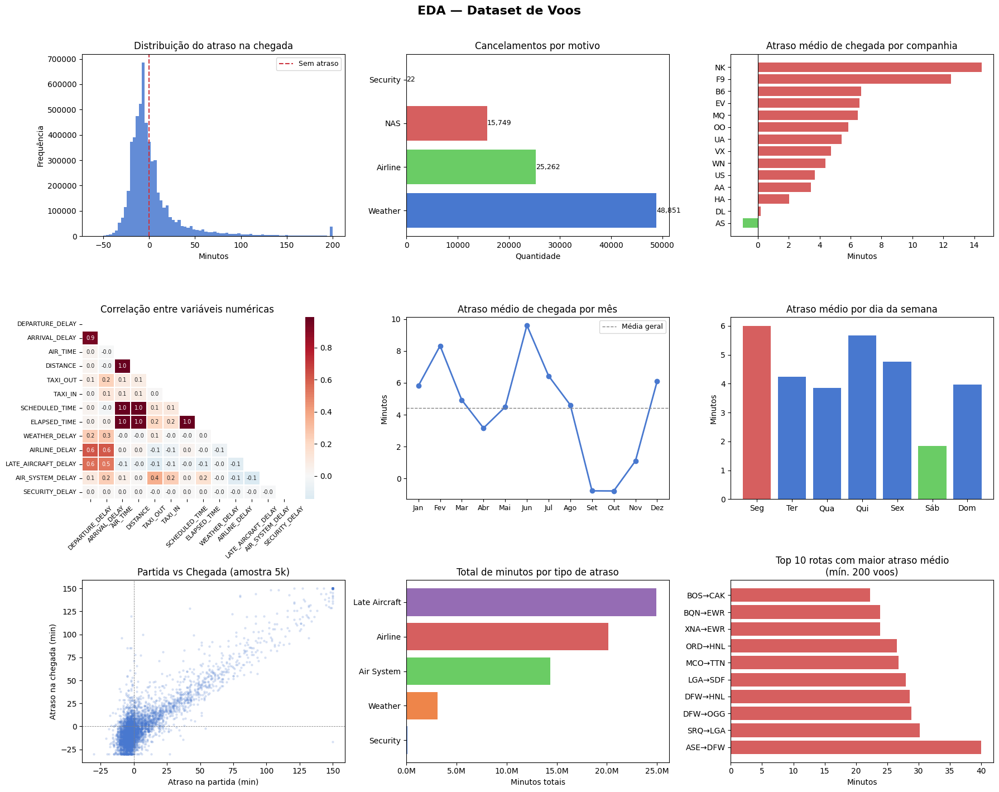


[OK] Gráfico salvo em eda_flights_plots.png


In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle("EDA — Dataset de Voos", fontsize=16, fontweight="bold", y=1.01)

# Distribuição de ARRIVAL_DELAY
ax = axes[0, 0]
if "ARRIVAL_DELAY" in flights.columns:
    data = flights["ARRIVAL_DELAY"].dropna().clip(-60, 200)
    ax.hist(data, bins=80, color="#4878CF", edgecolor="none", alpha=0.85)
    ax.axvline(0, color="#CC333F", lw=1.5, ls="--", label="Sem atraso")
    ax.set_title("Distribuição do atraso na chegada")
    ax.set_xlabel("Minutos")
    ax.set_ylabel("Frequência")
    ax.legend(fontsize=9)

# Cancelamentos por motivo
ax = axes[0, 1]
if "CANCELLATION_REASON" in flights.columns:
    cr_data = flights["CANCELLATION_REASON"].dropna().map(reason_map).value_counts()
    bars = ax.barh(cr_data.index, cr_data.values, color=["#4878CF","#6ACC65","#D65F5F","#B47CC7"])
    ax.set_title("Cancelamentos por motivo")
    ax.set_xlabel("Quantidade")
    for bar, val in zip(bars, cr_data.values):
        ax.text(val + 10, bar.get_y() + bar.get_height()/2,
                f"{val:,}", va="center", fontsize=9)

# Atraso médio por companhia
ax = axes[0, 2]
if "AIRLINE" in flights.columns and "ARRIVAL_DELAY" in flights.columns:
    al_delay = (flights.groupby("AIRLINE")["ARRIVAL_DELAY"].mean()
                  .sort_values().dropna())
    colors = ["#D65F5F" if v > 0 else "#6ACC65" for v in al_delay.values]
    ax.barh(al_delay.index, al_delay.values, color=colors)
    ax.axvline(0, color="black", lw=0.8)
    ax.set_title("Atraso médio de chegada por companhia")
    ax.set_xlabel("Minutos")

# Mapa de calor — correlação
ax = axes[1, 0]
corr_matrix = flights[num_cols].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, ax=ax, cmap="RdBu_r", center=0,
            annot=True, fmt=".1f", annot_kws={"size": 7},
            linewidths=0.3, square=False)
ax.set_title("Correlação entre variáveis numéricas")
ax.tick_params(axis="x", rotation=45, labelsize=8)
ax.tick_params(axis="y", labelsize=8)

# Atraso médio por mês
ax = axes[1, 1]
if "MONTH" in flights.columns and "ARRIVAL_DELAY" in flights.columns:
    monthly_vals = flights.groupby("MONTH")["ARRIVAL_DELAY"].mean()
    ax.plot(monthly_vals.index, monthly_vals.values, marker="o",
            color="#4878CF", lw=2)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(list(month_map.values()), fontsize=9)
    ax.set_title("Atraso médio de chegada por mês")
    ax.set_ylabel("Minutos")
    ax.axhline(monthly_vals.mean(), color="gray", ls="--", lw=1, label="Média geral")
    ax.legend(fontsize=9)

# Atraso médio por dia da semana
ax = axes[1, 2]
if "DAY_OF_WEEK" in flights.columns and "ARRIVAL_DELAY" in flights.columns:
    dow_vals = flights.groupby("DAY_OF_WEEK")["ARRIVAL_DELAY"].mean()
    colors = ["#D65F5F" if v == dow_vals.max() else
              "#6ACC65" if v == dow_vals.min() else "#4878CF"
              for v in dow_vals.values]
    ax.bar(list(dow_map.values()), dow_vals.values, color=colors)
    ax.set_title("Atraso médio por dia da semana")
    ax.set_ylabel("Minutos")

# Distribuição DEPARTURE_DELAY vs ARRIVAL_DELAY (amostra)
ax = axes[2, 0]
if "DEPARTURE_DELAY" in flights.columns and "ARRIVAL_DELAY" in flights.columns:
    sample = flights[["DEPARTURE_DELAY", "ARRIVAL_DELAY"]].dropna().sample(
        min(5000, len(flights)), random_state=42)
    ax.scatter(sample["DEPARTURE_DELAY"].clip(-30, 150),
               sample["ARRIVAL_DELAY"].clip(-30, 150),
               alpha=0.15, s=5, color="#4878CF")
    ax.set_xlabel("Atraso na partida (min)")
    ax.set_ylabel("Atraso na chegada (min)")
    ax.set_title("Partida vs Chegada (amostra 5k)")
    ax.axhline(0, color="gray", lw=0.6, ls="--")
    ax.axvline(0, color="gray", lw=0.6, ls="--")

# Composição dos tipos de atraso
ax = axes[2, 1]
delay_cols = [c for c in ["AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
                           "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY"] if c in flights.columns]
if delay_cols:
    delay_totals = flights[delay_cols].sum().sort_values(ascending=True)
    short_names  = [c.replace("_DELAY", "").replace("_", " ").title()
                    for c in delay_totals.index]
    ax.barh(short_names, delay_totals.values, color=sns.color_palette("muted", len(delay_cols)))
    ax.set_title("Total de minutos por tipo de atraso")
    ax.set_xlabel("Minutos totais")
    ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x/1e6:.1f}M"))

# Top 10 rotas com maior atraso médio
ax = axes[2, 2]
if all(c in flights.columns for c in ["ORIGIN_AIRPORT", "DESTINATION_AIRPORT", "ARRIVAL_DELAY"]):
    flights["ROUTE"] = flights["ORIGIN_AIRPORT"].astype(str) + "→" + flights["DESTINATION_AIRPORT"].astype(str)
    top_routes = (flights.groupby("ROUTE")["ARRIVAL_DELAY"]
                    .agg(["mean", "count"])
                    .query("count >= 200")
                    .nlargest(10, "mean"))
    ax.barh(top_routes.index, top_routes["mean"], color="#D65F5F")
    ax.set_title("Top 10 rotas com maior atraso médio\n(mín. 200 voos)")
    ax.set_xlabel("Minutos")

plt.tight_layout()
plt.savefig("eda_flights_plots.png", bbox_inches="tight", dpi=150)
plt.show()
print("\n[OK] Gráfico salvo em eda_flights_plots.png")

In [ ]:
flights_delays = flights[flights["CANCELLED"] == 0].copy()

delay_cols = ["AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
              "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY"]
flights_delays[delay_cols] = flights_delays[delay_cols].fillna(0)

In [ ]:
plt.rcParams.update({"figure.dpi": 120, "axes.spines.top": False,
                     "axes.spines.right": False})
sns.set_palette("muted")

In [ ]:
# Helper: parsear HHMM → hora do dia
def hhmm_to_hour(series):
    s = series.dropna().astype(int).astype(str).str.zfill(4)
    return s.str[:2].astype(int)

In [ ]:
### sazonalidade

In [ ]:
print("\n" + "=" * 65)
print("ATRASO MÉDIO POR MÊS / DIA DA SEMANA")
print("=" * 65)

if "MONTH" in flights_delays.columns and "ARRIVAL_DELAY" in flights_delays.columns:
    print("\n  Por Mês:")
    monthly = (flights_delays.groupby("MONTH")["ARRIVAL_DELAY"].mean()
                 .rename(index=month_map).round(2))
    print(monthly.to_string())

if "DAY_OF_WEEK" in flights_delays.columns and "ARRIVAL_DELAY" in flights_delays.columns:
    print("\n  Por Dia da Semana:")
    dow = (flights_delays.groupby("DAY_OF_WEEK")["ARRIVAL_DELAY"].mean()
             .rename(index=dow_map).round(2))
    print(dow.to_string())


ATRASO MÉDIO POR MÊS / DIA DA SEMANA

  Por Mês:
MONTH
Jan    5.81
Fev    8.32
Mar    4.92
Abr    3.16
Mai    4.49
Jun    9.60
Jul    6.43
Ago    4.61
Set   -0.77
Out   -0.78
Nov    1.10
Dez    6.09

  Por Dia da Semana:
DAY_OF_WEEK
Seg    6.00
Ter    4.25
Qua    3.85
Qui    5.67
Sex    4.76
Sáb    1.85
Dom    3.96


In [ ]:
print("=" * 65)
print("Atraso médio por hora de partida programada")
print("=" * 65)

# Atraso médio por hora do dia
if "SCHEDULED_DEPARTURE" in flights_delays.columns:
    flights_delays["HOUR"] = hhmm_to_hour(flights_delays["SCHEDULED_DEPARTURE"])
    hourly = flights_delays.groupby("HOUR")["ARRIVAL_DELAY"].mean().round(2)
    print(hourly.to_string())
    print(f"\n  Pior hora  : {hourly.idxmax()}h ({hourly.max():.1f} min)")
    print(f"  Melhor hora  : {hourly.idxmin()}h ({hourly.min():.1f} min)")


Atraso médio por hora de partida programada
HOUR
0      0.81
1      3.89
2      1.82
3      1.73
4      3.70
5     -3.78
6     -2.61
7     -1.50
8     -0.19
9      0.97
10     2.17
11     2.88
12     3.80
13     5.01
14     6.31
15     7.02
16     8.10
17     9.03
18     9.89
19    10.11
20     9.78
21     8.06
22     6.22
23     3.12

  Pior hora  : 19h (10.1 min)
  Melhor hora  : 5h (-3.8 min)


In [ ]:
print("=" * 65)
print("Atraso médio por dia do mês")
print("=" * 65)
# Atraso médio por dia do mês
if "DAY" in flights_delays.columns:
    daily = flights_delays.groupby("DAY")["ARRIVAL_DELAY"].mean().round(2)
    print(daily.to_string())
    print(f"\n  Pior dia  : {daily.idxmax()} ({daily.max():.1f} min)")
    print(f"  Melhor dia  : {daily.idxmin()} ({daily.min():.1f} min)")

Atraso médio por dia do mês
DAY
1     5.69
2     6.26
3     5.00
4     4.36
5     4.37
6     3.04
7     1.40
8     4.91
9     5.70
10    5.29
11    3.45
12    2.29
13    3.03
14    2.60
15    4.78
16    3.95
17    6.42
18    9.03
19    4.04
20    5.72
21    4.76
22    3.43
23    6.34
24    3.39
25    2.16
26    5.39
27    5.41
28    3.01
29    2.27
30    5.32
31    3.13

  Pior dia  : 18 (9.0 min)
  Melhor dia  : 7 (1.4 min)


In [ ]:
print("\n" + "=" * 65)
print("ANÁLISE DE AEROPORTOS")
print("=" * 65)

#  Top 15 aeroportos com maior TAXI_OUT médio
if "TAXI_OUT" in flights_delays.columns and "ORIGIN_AIRPORT" in flights_delays.columns:
    taxi_out = (flights_delays.groupby("ORIGIN_AIRPORT")["TAXI_OUT"]
                  .agg(["mean", "count"])
                  .query("count >= 500")
                  .nlargest(15, "mean")
                  .round(2))
    print("\nTop 15 aeroportos com maior TAXI_OUT médio (mín. 500 voos):")
    print(taxi_out.to_string())

#  Aeroportos com maior taxa de cancelamento
if "CANCELLED" in flights.columns and "ORIGIN_AIRPORT" in flights.columns:
    cancel_rate = (flights.groupby("ORIGIN_AIRPORT")["CANCELLED"]
                          .agg(["mean", "count"])
                          .query("count >= 500")
                          .nlargest(15, "mean"))
    cancel_rate["mean"] = (cancel_rate["mean"] * 100).round(2)
    cancel_rate.columns = ["Taxa_Cancelamento_%", "Total_Voos"]
    print("\nTop 15 aeroportos com maior taxa de cancelamento (mín. 500 voos):")
    print(cancel_rate.to_string())

#  Top rotas mais problemáticas (origem → destino)
if all(c in flights_delays.columns for c in ["ORIGIN_AIRPORT", "DESTINATION_AIRPORT", "ARRIVAL_DELAY"]):
    flights_delays["ROUTE"] = flights_delays["ORIGIN_AIRPORT"].astype(str) + " → " + flights_delays["DESTINATION_AIRPORT"].astype(str)
    top_routes = (flights_delays.groupby("ROUTE")["ARRIVAL_DELAY"]
                    .agg(["mean", "count"])
                    .query("count >= 200")
                    .nlargest(15, "mean")
                    .round(2))
    top_routes.columns = ["Atraso_Médio_min", "Voos"]
    print("\nTop 15 rotas com maior atraso médio (mín. 200 voos):")
    print(top_routes.to_string())



ANÁLISE DE AEROPORTOS

Top 15 aeroportos com maior TAXI_OUT médio (mín. 500 voos):
                 mean   count
ORIGIN_AIRPORT               
JFK             27.01   91889
LGA             26.72   95074
12953           26.23    8010
12478           23.77    7800
PHL             21.71   64947
ISN             21.00    2513
EWR             20.19   98662
11057           20.02    9012
BOS             20.02  105193
13930           19.99   26078
14100           19.92    5722
CLT             19.65   99243
12266           19.58     718
ORD             19.54  277336
11109           19.47     572

Top 15 aeroportos com maior taxa de cancelamento (mín. 500 voos):
                Taxa_Cancelamento_%  Total_Voos
ORIGIN_AIRPORT                                 
SUN                            9.21         956
DVL                            8.76         525
ASE                            7.75        3562
MKG                            7.35         667
JMS                            7.27         812
LAW

In [ ]:
print("\n" + "=" * 65)
print("ANÁLISE DE AERONAVES")
print("=" * 65)

if "TAIL_NUMBER" in flights_delays.columns and "ARRIVAL_DELAY" in flights_delays.columns:
    tail = (flights_delays.groupby("TAIL_NUMBER")["ARRIVAL_DELAY"]
              .agg(["mean", "count"])
              .query("count >= 100")
              .nlargest(15, "mean")
              .round(2))
    tail.columns = ["Atraso_Médio_min", "Voos"]
    print("\nTop 15 aeronaves com maior atraso médio (mín. 100 voos):")
    print(tail.to_string())

# Efeito cascata: proporção de voos com LATE_AIRCRAFT_DELAY > 0
if "LATE_AIRCRAFT_DELAY" in flights_delays.columns:
    cascata = (flights_delays["LATE_AIRCRAFT_DELAY"] > 0).sum()
    print(f"\nVoos com efeito cascata (LATE_AIRCRAFT_DELAY > 0): "
          f"{cascata:,} ({cascata/len(flights_delays)*100:.1f}%)")
    print(f"Atraso médio nesses voos: "
          f"{flights_delays[flights_delays['LATE_AIRCRAFT_DELAY'] > 0]['ARRIVAL_DELAY'].mean():.1f} min")


ANÁLISE DE AERONAVES

Top 15 aeronaves com maior atraso médio (mín. 100 voos):
             Atraso_Médio_min  Voos
TAIL_NUMBER                        
N606MQ                  29.44   299
N271AY                  29.42   159
N5BRAA                  28.61   132
N76054                  27.59   116
N273AY                  27.49   108
N673MQ                  26.74   119
N820AS                  25.56   366
N283VA                  25.07   135
N382AA                  24.59   301
N834AS                  24.39   315
N374AA                  24.22   181
N345AA                  24.13   103
N292SW                  23.37   274
N675MQ                  23.33   269
N27903                  23.27   114

Voos com efeito cascata (LATE_AIRCRAFT_DELAY > 0): 556,953 (9.7%)
Atraso médio nesses voos: 64.3 min


In [ ]:
print("\n" + "=" * 65)
print("OUTLIERS DE ATRASO")
print("=" * 65)

if "ARRIVAL_DELAY" in flights_delays.columns:
    arr = flights_delays["ARRIVAL_DELAY"].dropna()
    media   = arr.mean()
    desvio  = arr.std()
    limite  = media + 3 * desvio

    outliers = flights_delays[flights_delays["ARRIVAL_DELAY"] > limite]
    print(f"\n  Limite (média + 3σ)     : {limite:.1f} min")
    print(f"  Outliers identificados  : {len(outliers):,} ({len(outliers)/len(flights_delays)*100:.2f}%)")
    print(f"  Atraso médio (outliers) : {outliers['ARRIVAL_DELAY'].mean():.1f} min")
    print(f"  Atraso máximo           : {outliers['ARRIVAL_DELAY'].max():.0f} min")

    if "AIRLINE" in outliers.columns:
        print("\n  Outliers por companhia:")
        print(outliers["AIRLINE"].value_counts().head(10).to_string())

    if "MONTH" in outliers.columns:
        print("\n  Outliers por mês:")
        print(outliers["MONTH"].value_counts().sort_index().to_string())


OUTLIERS DE ATRASO

  Limite (média + 3σ)     : 122.2 min
  Outliers identificados  : 110,956 (1.94%)
  Atraso médio (outliers) : 200.7 min
  Atraso máximo           : 1971 min

  Outliers por companhia:
AIRLINE
WN    19041
UA    13651
EV    13525
DL    13289
AA    13200
OO    11644
MQ     6866
B6     6834
NK     4247
F9     3111

  Outliers por mês:
MONTH
1      8948
2      9806
3      9241
4      7820
5     10073
6     14446
7     11273
8     10065
9      5174
10     5445
11     7032
12    11633


In [ ]:
print("\n" + "=" * 65)
print("DIFERENÇA DE ATRASO ENTRE GRUPOS - Analysis of Variance")
print("=" * 65)

# F: razão entre a variância entre grupos e a variância dentro dos grupos.
# Quanto maior, mais os grupos se diferem entre si em relação à sua variação interna.
# p-value: probabilidade de observar esse F por acaso assumindo que todos os grupos têm a mesma média.
# Se p < 0.05, a diferença é considerada estatisticamente significativa.

def rodar_anova(flights_delays, grupo_col, target="ARRIVAL_DELAY"):
    grupos = [g[target].dropna().values
              for _, g in flights_delays.groupby(grupo_col)
              if len(g[target].dropna()) >= 30]
    f, p = stats.f_oneway(*grupos)
    return f, p

if "AIRLINE" in flights_delays.columns:
    f, p = rodar_anova(flights_delays, "AIRLINE")
    sig = "SIM" if p < 0.05 else "NÃO"
    print(f"\n  AIRLINE    → F={f:.2f}, p={p:.4f} — diferença significativa? {sig} - escolher a companhia realmente importa para o atraso esperado.")

if "ORIGIN_AIRPORT" in flights_delays.columns:
    f, p = rodar_anova(flights_delays, "ORIGIN_AIRPORT")
    sig = "SIM" if p < 0.05 else "NÃO"
    print(f"  ORIGIN_AIRPORT → F={f:.2f}, p={p:.4f} — diferença significativa? {sig} - há aeroportos estruturalmente mais problemáticos que outros.")

if "DAY_OF_WEEK" in flights_delays.columns:
    f, p = rodar_anova(flights_delays, "DAY_OF_WEEK")
    sig = "SIM" if p < 0.05 else "NÃO"
    print(f"  DAY_OF_WEEK    → F={f:.2f}, p={p:.4f} — diferença significativa? {sig} - há dias sistematicamente piores.")


DIFERENÇA DE ATRASO ENTRE GRUPOS - Analysis of Variance

  AIRLINE    → F=2312.21, p=0.0000 — diferença significativa? SIM - escolher a companhia realmente importa para o atraso esperado.
  ORIGIN_AIRPORT → F=43.78, p=0.0000 — diferença significativa? SIM - há aeroportos estruturalmente mais problemáticos que outros.
  DAY_OF_WEEK    → F=926.35, p=0.0000 — diferença significativa? SIM - há dias sistematicamente piores.


In [ ]:
print("\n" + "=" * 65)
print("DISTRIBUIÇÃO POR FAIXAS DE ATRASO")
print("=" * 65)

if "ARRIVAL_DELAY" in flights_delays.columns:
    bins   = [-np.inf, -1, 15, 60, 120, np.inf]
    labels = ["Adiantado", "No horário", "Leve (1-60)", "Moderado (61-120)", "Severo (>120)"]
    flights_delays["FAIXA_ATRASO"] = pd.cut(flights_delays["ARRIVAL_DELAY"], bins=bins, labels=labels)
    faixas = flights_delays["FAIXA_ATRASO"].value_counts().reindex(labels)
    faixas_pct = (faixas / faixas.sum() * 100).round(2)
    resultado = pd.DataFrame({"Voos": faixas, "%": faixas_pct})
    print(resultado.to_string())



DISTRIBUIÇÃO POR FAIXAS DE ATRASO
                      Voos      %
FAIXA_ATRASO                     
Adiantado          3500899  61.27
No horário         1189611  20.82
Leve (1-60)         704406  12.33
Moderado (61-120)   204672   3.58
Severo (>120)       114420   2.00


In [ ]:
print("\n" + "=" * 65)
print("RECUPERAÇÃO DE ATRASO EM VOO")
print("=" * 65)

if all(c in flights_delays.columns for c in ["DEPARTURE_DELAY", "ARRIVAL_DELAY"]):
    flights_delays["DELAY_RECOVERED"] = flights_delays["DEPARTURE_DELAY"] - flights_delays["ARRIVAL_DELAY"]
    atrasados = flights_delays[flights_delays["DEPARTURE_DELAY"] > 15].copy()

    print(f"\n  Voos que saíram com atraso > 15 min: {len(atrasados):,}")
    recuperou = (atrasados["DELAY_RECOVERED"] > 0).sum()
    print(f"  Recuperaram parte do atraso em voo : {recuperou:,} ({recuperou/len(atrasados)*100:.1f}%)")
    print(f"  Recuperação média (quando positiva): "
          f"{atrasados[atrasados['DELAY_RECOVERED'] > 0]['DELAY_RECOVERED'].mean():.1f} min")

    if "AIRLINE" in atrasados.columns:
        print("\n  Recuperação média por companhia (voos atrasados na partida):")
        rec_airline = (atrasados.groupby("AIRLINE")["DELAY_RECOVERED"]
                                .mean()
                                .sort_values(ascending=False)
                                .round(2))
        print(rec_airline.to_string())


RECUPERAÇÃO DE ATRASO EM VOO

  Voos que saíram com atraso > 15 min: 1,016,536
  Recuperaram parte do atraso em voo : 705,979 (69.4%)
  Recuperação média (quando positiva): 11.9 min

  Recuperação média por companhia (voos atrasados na partida):
AIRLINE
UA    9.40
DL    6.48
AA    5.28
WN    5.24
B6    3.74
AS    3.33
VX    3.32
OO    2.60
US    2.06
EV    1.61
NK    1.24
F9    0.35
MQ   -0.31
HA   -1.55


In [ ]:
fig, axes = plt.subplots(4, 2, figsize=(16, 22))
fig.suptitle("Dataset de Voos", fontsize=16, fontweight="bold", y=1.01)

# Atraso por hora do dia
ax = axes[0, 0]
if "HOUR" in flights_delays.columns:
    hourly.plot(ax=ax, marker="o", color="#4878CF", lw=2)
    ax.set_title("Atraso médio por hora de partida")
    ax.set_xlabel("Hora do dia")
    ax.set_ylabel("Minutos")
    ax.axhline(hourly.mean(), color="gray", ls="--", lw=1, label="Média")
    ax.legend(fontsize=9)

# Faixas de atraso — pizza
ax = axes[0, 1]
if "FAIXA_ATRASO" in flights_delays.columns:
    colors = ["#6ACC65", "#4878CF", "#F5C842", "#E08330", "#D65F5F"]
    faixas.plot.pie(ax=ax, autopct="%1.1f%%", colors=colors,
                    startangle=90, textprops={"fontsize": 9})
    ax.set_title("Distribuição por faixa de atraso")
    ax.set_ylabel("")

# Top aeroportos por TAXI_OUT
ax = axes[1, 0]
if "TAXI_OUT" in flights_delays.columns and "ORIGIN_AIRPORT" in flights_delays.columns:
    taxi_agg = flights_delays.groupby("ORIGIN_AIRPORT")["TAXI_OUT"].agg(["mean", "count"])
    top_taxi = taxi_agg[taxi_agg["count"] >= 500].nlargest(12, "mean")
    ax.barh(top_taxi.index.astype(str), top_taxi["mean"], color="#4878CF")
    ax.set_title("Top 12 aeroportos — TAXI_OUT médio")
    ax.set_xlabel("Minutos")

# Boxplot atraso por companhia
ax = axes[1, 1]
if "AIRLINE" in flights_delays.columns and "ARRIVAL_DELAY" in flights_delays.columns:
    order = (flights_delays.groupby("AIRLINE")["ARRIVAL_DELAY"]
               .median()
               .sort_values()
               .index
               .astype(str)
               .tolist())
    data_box = flights_delays[["AIRLINE", "ARRIVAL_DELAY"]].copy()
    data_box["AIRLINE"] = data_box["AIRLINE"].astype(str)
    data_box["ARRIVAL_DELAY"] = data_box["ARRIVAL_DELAY"].clip(-30, 120)
    sns.boxplot(
        data=data_box,
        x="ARRIVAL_DELAY",
        y="AIRLINE",
        order=order,
        ax=ax,
        showfliers=False,
        medianprops={"color": "#D65F5F", "linewidth": 2},
    )
    ax.set_title("Atraso de chegada por companhia (sem outliers)")
    ax.set_xlabel("Minutos")
    ax.set_ylabel("")

# QQ-plot de ARRIVAL_DELAY
ax = axes[2, 0]
if "ARRIVAL_DELAY" in flights_delays.columns:
    sample_qq = flights_delays["ARRIVAL_DELAY"].dropna().sample(min(5000, len(flights_delays)), random_state=42)
    stats.probplot(sample_qq, plot=ax)
    ax.set_title("QQ-plot — ARRIVAL_DELAY (amostra 5k)")
    ax.get_lines()[0].set(markersize=2, alpha=0.4, color="#4878CF")
    ax.get_lines()[1].set(color="#D65F5F", lw=1.5)

# Correlação Spearman vs Pearson
ax = axes[2, 1]
pearson_corr = flights_delays[num_cols].corr(method='pearson')["ARRIVAL_DELAY"].drop("ARRIVAL_DELAY")
spearman_corr = flights_delays[num_cols].corr(method='spearman')["ARRIVAL_DELAY"].drop("ARRIVAL_DELAY")
comp_flights_delays = pd.DataFrame({
    "Pearson" : pearson_corr,
    "Spearman": spearman_corr
}).dropna().sort_values("Spearman")

x = np.arange(len(comp_flights_delays))
w = 0.35
ax.barh(x - w/2, comp_flights_delays["Pearson"],  w, label="Pearson",  color="#4878CF", alpha=0.85)
ax.barh(x + w/2, comp_flights_delays["Spearman"], w, label="Spearman", color="#6ACC65", alpha=0.85)
ax.set_yticks(x)
ax.set_yticklabels(comp_flights_delays.index, fontsize=8)
ax.axvline(0, color="black", lw=0.7)
ax.set_title("Pearson vs Spearman — correlação com ARRIVAL_DELAY")
ax.legend(fontsize=9)

# Recuperação de atraso por companhia
ax = axes[3, 0]
if "DELAY_RECOVERED" in flights_delays.columns and "AIRLINE" in flights_delays.columns:
    rec = (flights_delays[flights_delays["DEPARTURE_DELAY"] > 15]
             .groupby("AIRLINE")["DELAY_RECOVERED"]
             .mean()
             .sort_values())
    colors = ["#6ACC65" if v > 0 else "#D65F5F" for v in rec.values]
    ax.barh(rec.index, rec.values, color=colors)
    ax.axvline(0, color="black", lw=0.8)
    ax.set_title("Recuperação média de atraso em voo por companhia\n(voos com partida > 15 min atrasada)")
    ax.set_xlabel("Minutos recuperados")

# Distribuição de outliers por mês
ax = axes[3, 1]
if "ARRIVAL_DELAY" in flights_delays.columns and "MONTH" in flights_delays.columns:
    month_map = {1:"Jan",2:"Fev",3:"Mar",4:"Abr",5:"Mai",6:"Jun",
                 7:"Jul",8:"Ago",9:"Set",10:"Out",11:"Nov",12:"Dez"}
    outliers_month = (flights_delays[flights_delays["ARRIVAL_DELAY"] > limite]
                        .groupby("MONTH")
                        .size()
                        .rename(index=month_map))
    ax.bar(outliers_month.index, outliers_month.values, color="#D65F5F")
    ax.set_title(f"Outliers de atraso por mês (> {limite:.0f} min)")
    ax.set_ylabel("Quantidade de voos")

plt.tight_layout()
plt.savefig("eda_flights_avancado_plots.png", bbox_inches="tight", dpi=150)
plt.show()
print("\n[OK] Gráfico salvo em eda_flights_avancado_plots.png")
print("[OK] EDA avançada concluída!")

## Classificação - supervisionada

Classificação de Atraso de Voos antes da partida

Target: ARRIVAL_DELAY > 0 (voo chegará atrasado?)



### Target

In [ ]:
df = flights.dropna(subset=["ARRIVAL_DELAY"]) # Remove as linhas em que o atraso de chegada é nulo
df["TARGET"] = (df["ARRIVAL_DELAY"] > 0).astype(int)

In [ ]:
df

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,TARGET
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,...,-22.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,...,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,...,5.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,1
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,...,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,...,-21.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5819074,2015,12,31,4,B6,688,N657JB,LAX,BOS,2359,...,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
5819075,2015,12,31,4,B6,745,N828JB,JFK,PSE,2359,...,-16.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
5819076,2015,12,31,4,B6,1503,N913JB,JFK,SJU,2359,...,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
5819077,2015,12,31,4,B6,333,N527JB,MCO,SJU,2359,...,-10.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0


In [ ]:
atrasado = df["TARGET"].sum()
nao = len(df) - atrasado
print(f"  Atrasado (1) : {atrasado:,}  ({atrasado/len(df)*100:.1f}%)")
print(f"  No horário (0): {nao:,}  ({nao/len(df)*100:.1f}%)")
scale_pos_weight = round(nao / atrasado, 2) # Para ajustar o peso da classe de atraso para compensar o desbalanceamento
print(f"  scale_pos_weight : {scale_pos_weight}")

  Atrasado (1) : 2,086,896  (36.5%)
  No horário (0): 3,627,112  (63.5%)
  scale_pos_weight : 1.74


### Seleção de features

In [ ]:

# Removemos qualquer feature de atraso que só
# é conhecido após o voo. Mantemos o dataset sem data leakage de variáveis pós-voo

LEAKAGE_COLS = [
    "ARRIVAL_DELAY", "ARRIVAL_TIME", "ELAPSED_TIME", "AIR_TIME",
    "WHEELS_ON", "TAXI_IN", "SCHEDULED_ARRIVAL",
    "AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
    "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY",
    "TARGET", "DEPARTURE_DELAY", "WHEELS_OFF", "DEPARTURE_TIME"
]

# Colunas identificadoras que não entram no modelo
ID_COLS = ["FLIGHT_NUMBER", "TAIL_NUMBER"]

cancelados_ou_desviados = flights[(flights["CANCELLED"] == 1) | (flights["DIVERTED"] == 1)]

nulos = cancelados_ou_desviados["ARRIVAL_DELAY"].isna().sum()
total = len(cancelados_ou_desviados)

print(f"Total de voos cancelados ou desviados: {total:,}")
print(f"Com ARRIVAL_DELAY nulo: {nulos:,} ({nulos/total*100:.1f}%)")
print(f"Com ARRIVAL_DELAY preenchido: {total-nulos:,} ({(total-nulos)/total*100:.1f}%) \n")

#Voos cancelados e desviados já não estão no dataset, então, também retiramos suas colunas
OTHERS_TO_DROP = ["YEAR", "CANCELLED", "DIVERTED", "CANCELLATION_REASON"]

drop_cols = LEAKAGE_COLS + ID_COLS + OTHERS_TO_DROP
feature_cols = [c for c in df.columns if c not in drop_cols]

# Remover colunas com muitos nulos (> 50%)
null_pct = df[feature_cols].isnull().mean()
feature_cols = [c for c in feature_cols if null_pct[c] <= 0.50]

print(f"\n  Features selecionadas : {len(feature_cols)}")
print(f"  Colunas descartadas   : leakage + id + nulos> 50% + outros")

Total de voos cancelados ou desviados: 105,071
Com ARRIVAL_DELAY nulo: 105,071 (100.0%)
Com ARRIVAL_DELAY preenchido: 0 (0.0%) 


  Features selecionadas : 10
  Colunas descartadas   : leakage + id + nulos> 50% + outros


In [ ]:
len(LEAKAGE_COLS)

16

### Tratamento das features

In [ ]:
X = df[feature_cols].copy()
print(feature_cols)
y = df["TARGET"]

cat_cols = X.select_dtypes(include=["object", "category"]).columns.tolist()
print(f"\n  Categóricas com Label Encoding : {cat_cols}")

le = LabelEncoder()
for col in cat_cols:
    X[col] = X[col].astype(str).fillna("MISSING")
    X[col] = le.fit_transform(X[col])

# Preencher nulos numéricos com mediana
for col in X.select_dtypes(include=np.number).columns:
    X[col] = X[col].fillna(X[col].median())

print(f"  Shape final de X : {X.shape}")


['MONTH', 'DAY', 'DAY_OF_WEEK', 'AIRLINE', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT', 'SCHEDULED_DEPARTURE', 'TAXI_OUT', 'SCHEDULED_TIME', 'DISTANCE']

  Categóricas com Label Encoding : ['AIRLINE', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT']
  Shape final de X : (5714008, 10)


### Divisão do dataset

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)
print(f"\n  Treino : {X_train.shape[0]:,}  |  Teste : {X_test.shape[0]:,}")


  Treino : 4,571,206  |  Teste : 1,142,802


### Treinamento - XGBoost

In [ ]:
model = XGBClassifier(
    n_estimators      = 500,
    max_depth         = 6,
    learning_rate     = 0.05,
    subsample         = 0.8,
    colsample_bytree  = 0.8,
    scale_pos_weight  = scale_pos_weight,
    eval_metric       = "logloss",
    early_stopping_rounds = 20,
    random_state      = 42,
    n_jobs            = -1,
    verbosity         = 0,
)

model.fit(
    X_train, y_train,
    eval_set=[(X_test, y_test)],
    verbose=False,
)

best_iter = model.best_iteration
print(f"  Melhor iteração (early stopping) : {best_iter}")

  Melhor iteração (early stopping) : 499


### Avaliação

In [ ]:
y_pred      = model.predict(X_test)
y_proba     = model.predict_proba(X_test)[:, 1]

print("\n  Classification Report:")
print(classification_report(y_test, y_pred, target_names=["No horário","Atrasado"]))

roc_auc = roc_auc_score(y_test, y_proba)
avg_prc = average_precision_score(y_test, y_proba)
print(f"  ROC-AUC          : {roc_auc:.4f}")
print(f"  Avg Precision    : {avg_prc:.4f}")

# Cross-validation (5-fold)
print("\n  Cross-Validation (5-fold StratifiedKFold) — ROC-AUC:")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Para CV usa modelo sem early stopping
model_cv = XGBClassifier(
    n_estimators     = best_iter + 1,
    max_depth        = 6,
    learning_rate    = 0.05,
    subsample        = 0.8,
    colsample_bytree = 0.8,
    scale_pos_weight = scale_pos_weight,
    eval_metric      = "logloss",
    random_state     = 42,
    n_jobs           = -1,
    verbosity        = 0,
)
cv_scores = cross_val_score(model_cv, X, y, cv=cv, scoring="roc_auc", n_jobs=-1)
print(f"  Scores : {[round(s,4) for s in cv_scores]}")
print(f"  Média  : {cv_scores.mean():.4f}  ±  {cv_scores.std():.4f}")


  Classification Report:
              precision    recall  f1-score   support

  No horário       0.78      0.73      0.75    725423
    Atrasado       0.58      0.64      0.60    417379

    accuracy                           0.70   1142802
   macro avg       0.68      0.68      0.68   1142802
weighted avg       0.70      0.70      0.70   1142802

  ROC-AUC          : 0.7530
  Avg Precision    : 0.6754

  Cross-Validation (5-fold StratifiedKFold) — ROC-AUC:
  Scores : [np.float64(0.7526), np.float64(0.7537), np.float64(0.7533), np.float64(0.7533), np.float64(0.7537)]
  Média  : 0.7533  ±  0.0004


### Feature importance

In [ ]:
importances = pd.Series(
    model.get_booster().get_score(importance_type="gain"),
    name="gain"
).sort_values(ascending=False)

print(importances.to_string())

TAXI_OUT               1807.042480
SCHEDULED_DEPARTURE     384.969543
AIRLINE                 335.771667
MONTH                   290.894196
DAY                     216.269104
SCHEDULED_TIME          161.967270
DAY_OF_WEEK             153.804688
DISTANCE                144.922516
ORIGIN_AIRPORT          131.435593
DESTINATION_AIRPORT      94.131310


### threshold

In [ ]:
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba)
f1_scores = 2 * precisions * recalls / (precisions + recalls + 1e-9)
best_idx   = np.argmax(f1_scores)
best_thr   = thresholds[best_idx] if best_idx < len(thresholds) else 0.5

print(f"  Limiar padrão (0.5) → F1 = {f1_scores[np.searchsorted(thresholds, 0.5)]:.4f}")
print(f"  Limiar ótimo ({best_thr:.3f}) → F1 = {f1_scores[best_idx]:.4f}")

y_pred_opt = (y_proba >= best_thr).astype(int)
print("\n  Classification Report com limiar ótimo:")
print(classification_report(y_test, y_pred_opt, target_names=["No horário","Atrasado"]))

  Limiar padrão (0.5) → F1 = 0.6045
  Limiar ótimo (0.442) → F1 = 0.6128

  Classification Report com limiar ótimo:
              precision    recall  f1-score   support

  No horário       0.80      0.61      0.69    725423
    Atrasado       0.52      0.74      0.61    417379

    accuracy                           0.66   1142802
   macro avg       0.66      0.68      0.65   1142802
weighted avg       0.70      0.66      0.66   1142802



### Visualizações

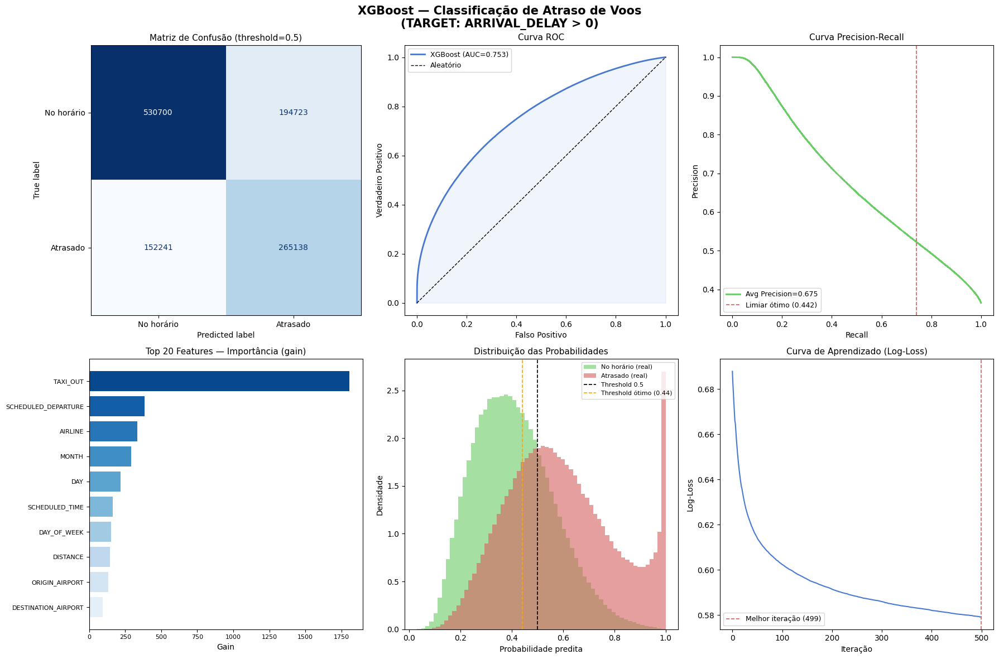

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("XGBoost — Classificação de Atraso de Voos\n(TARGET: ARRIVAL_DELAY > 0)",
             fontsize=15, fontweight="bold")

# 1. Matriz de confusão (limiar padrão)
ax = axes[0, 0]
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=["No horário", "Atrasado"])
disp.plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title(f"Matriz de Confusão (threshold=0.5)", fontsize=11)

# 2. Curva ROC
ax = axes[0, 1]
fpr, tpr, _ = roc_curve(y_test, y_proba)
ax.plot(fpr, tpr, color="#4878CF", lw=2, label=f"XGBoost (AUC={roc_auc:.3f})")
ax.plot([0,1],[0,1], "k--", lw=1, label="Aleatório")
ax.fill_between(fpr, tpr, alpha=0.08, color="#4878CF")
ax.set_xlabel("Falso Positivo")
ax.set_ylabel("Verdadeiro Positivo")
ax.set_title("Curva ROC", fontsize=11)
ax.legend(fontsize=9)

# 3. Curva Precision-Recall
ax = axes[0, 2]
ax.plot(recalls, precisions, color="#6ACC65", lw=2,
        label=f"Avg Precision={avg_prc:.3f}")
ax.axvline(recalls[best_idx], color="#D65F5F", ls="--", lw=1.2,
           label=f"Limiar ótimo ({best_thr:.3f})")
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Curva Precision-Recall", fontsize=11)
ax.legend(fontsize=9)

# 4. Top 20 features por importância (gain)
ax = axes[1, 0]
top20 = importances.head(20)
colors_fi = sns.color_palette("Blues_r", len(top20))
ax.barh(top20.index[::-1], top20.values[::-1], color=colors_fi[::-1])
ax.set_title("Top 20 Features — Importância (gain)", fontsize=11)
ax.set_xlabel("Gain")
ax.tick_params(labelsize=8)

# 5. Distribuição de probabilidade predita
ax = axes[1, 1]
ax.hist(y_proba[y_test == 0], bins=60, alpha=0.6, color="#6ACC65",
        label="No horário (real)", density=True)
ax.hist(y_proba[y_test == 1], bins=60, alpha=0.6, color="#D65F5F",
        label="Atrasado (real)", density=True)
ax.axvline(0.5, color="black", lw=1.2, ls="--", label="Threshold 0.5")
ax.axvline(best_thr, color="orange", lw=1.2, ls="--",
           label=f"Threshold ótimo ({best_thr:.2f})")
ax.set_xlabel("Probabilidade predita")
ax.set_ylabel("Densidade")
ax.set_title("Distribuição das Probabilidades", fontsize=11)
ax.legend(fontsize=8)

# 6. Aprendizado — log-loss por iteração
ax = axes[1, 2]
results = model.evals_result()
if "validation_0" in results:
    logloss_vals = results["validation_0"]["logloss"]
    ax.plot(logloss_vals, color="#4878CF", lw=1.5)
    ax.axvline(best_iter, color="#D65F5F", ls="--", lw=1.2,
               label=f"Melhor iteração ({best_iter})")
    ax.set_xlabel("Iteração")
    ax.set_ylabel("Log-Loss")
    ax.set_title("Curva de Aprendizado (Log-Loss)", fontsize=11)
    ax.legend(fontsize=9)

plt.tight_layout()
plt.savefig("xgboost_classification_plots.png", bbox_inches="tight", dpi=150)
plt.show()


### Treinamento - LightGBM

In [ ]:
lgbm_model = LGBMClassifier(
    n_estimators      = 300,
    max_depth         = 6,
    learning_rate     = 0.05,
    subsample         = 0.8,
    colsample_bytree  = 0.8,
    scale_pos_weight  = scale_pos_weight,
    random_state      = 42,
    n_jobs            = -1,
    verbosity         = -1,
)

lgbm_model.fit(
    X_train, y_train,
    eval_set=[(X_test, y_test)],
    callbacks=[lgb.early_stopping(stopping_rounds=20, verbose=False)],
)

lgbm_best_iter = lgbm_model.best_iteration_
print(f"  Melhor iteração (early stopping) : {lgbm_best_iter}")

  Melhor iteração (early stopping) : 300


### Avaliação

In [ ]:
lgbm_y_pred  = lgbm_model.predict(X_test)
lgbm_y_proba = lgbm_model.predict_proba(X_test)[:, 1]

print("\n  Classification Report:")
print(classification_report(y_test, lgbm_y_pred, target_names=["No horário","Atrasado"]))

lgbm_roc_auc = roc_auc_score(y_test, lgbm_y_proba)
lgbm_avg_prc = average_precision_score(y_test, lgbm_y_proba)
print(f"  ROC-AUC          : {lgbm_roc_auc:.4f}")
print(f"  Avg Precision    : {lgbm_avg_prc:.4f}")

# Cross-validation (5-fold)
print("\n  Cross-Validation (5-fold StratifiedKFold) — ROC-AUC:")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Para CV usa modelo sem early stopping
lgbm_model_cv = LGBMClassifier(
    n_estimators     = lgbm_best_iter + 1,
    max_depth        = 6,
    learning_rate    = 0.05,
    subsample        = 0.8,
    colsample_bytree = 0.8,
    scale_pos_weight = scale_pos_weight,
    random_state     = 42,
    n_jobs           = -1,
    verbosity        = -1,
)
lgbm_cv_scores = cross_val_score(lgbm_model_cv, X, y, cv=cv, scoring="roc_auc", n_jobs=-1)
print(f"  Scores : {[round(s,4) for s in lgbm_cv_scores]}")
print(f"  Média  : {lgbm_cv_scores.mean():.4f}  ±  {lgbm_cv_scores.std():.4f}")


  Classification Report:
              precision    recall  f1-score   support

  No horário       0.77      0.73      0.75    725423
    Atrasado       0.57      0.62      0.59    417379

    accuracy                           0.69   1142802
   macro avg       0.67      0.67      0.67   1142802
weighted avg       0.70      0.69      0.69   1142802

  ROC-AUC          : 0.7414
  Avg Precision    : 0.6620

  Cross-Validation (5-fold StratifiedKFold) — ROC-AUC:
  Scores : [np.float64(0.7407), np.float64(0.7421), np.float64(0.7417), np.float64(0.7416), np.float64(0.7416)]
  Média  : 0.7415  ±  0.0004


### Feature importance

In [ ]:
lgbm_importances = pd.Series(
    lgbm_model.booster_.feature_importance(importance_type="gain"),
    index=X_train.columns,
    name="gain"
).sort_values(ascending=False)

print("\n  Top 20 features por gain:")
print(lgbm_importances.head(20).round(2).to_string())


  Top 20 features por gain:
TAXI_OUT               5758935.71
SCHEDULED_DEPARTURE    1464183.85
AIRLINE                1140684.96
MONTH                   911525.29
SCHEDULED_TIME          740375.63
DISTANCE                606367.77
DAY                     598845.26
ORIGIN_AIRPORT          491751.15
DESTINATION_AIRPORT     190403.01
DAY_OF_WEEK             138102.76


### threshold

In [ ]:
lgbm_precisions, lgbm_recalls, lgbm_thresholds = precision_recall_curve(y_test, lgbm_y_proba)
lgbm_f1_scores = 2 * lgbm_precisions * lgbm_recalls / (lgbm_precisions + lgbm_recalls + 1e-9)
lgbm_best_idx  = np.argmax(lgbm_f1_scores)
lgbm_best_thr  = lgbm_thresholds[lgbm_best_idx] if lgbm_best_idx < len(lgbm_thresholds) else 0.5

print(f"  Limiar padrão (0.5) → F1 = {lgbm_f1_scores[np.searchsorted(lgbm_thresholds, 0.5)]:.4f}")
print(f"  Limiar ótimo ({lgbm_best_thr:.3f}) → F1 = {lgbm_f1_scores[lgbm_best_idx]:.4f}")

lgbm_y_pred_opt = (lgbm_y_proba >= lgbm_best_thr).astype(int)
print("\n  Classification Report com limiar ótimo:")
print(classification_report(y_test, lgbm_y_pred_opt, target_names=["No horário","Atrasado"]))

  Limiar padrão (0.5) → F1 = 0.5933
  Limiar ótimo (0.439) → F1 = 0.6041

  Classification Report com limiar ótimo:
              precision    recall  f1-score   support

  No horário       0.80      0.58      0.67    725423
    Atrasado       0.51      0.75      0.60    417379

    accuracy                           0.64   1142802
   macro avg       0.65      0.66      0.64   1142802
weighted avg       0.69      0.64      0.65   1142802



### Visualizações

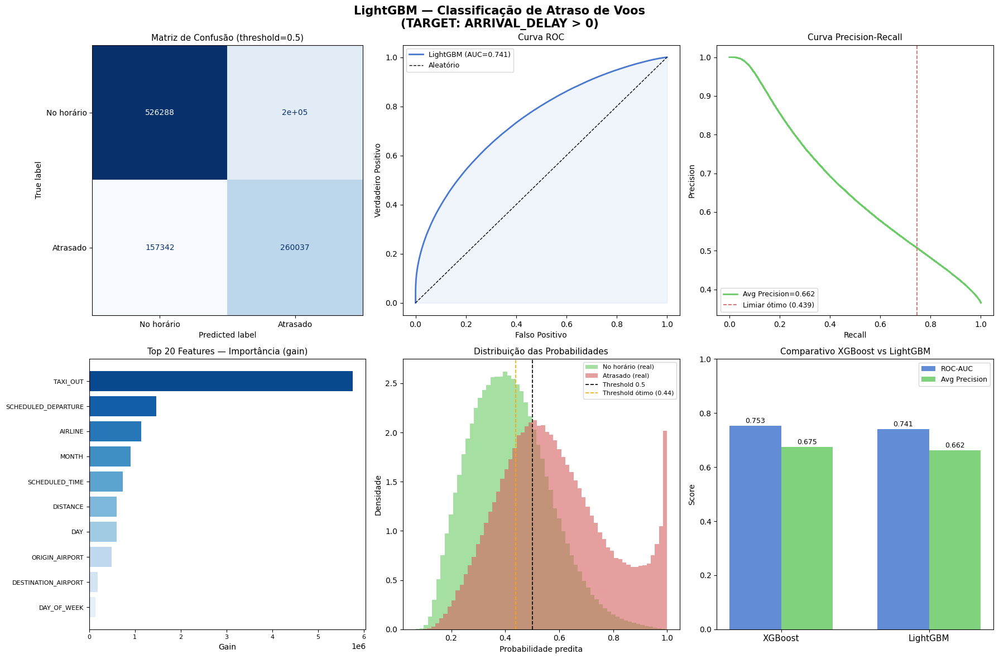

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("LightGBM — Classificação de Atraso de Voos\n(TARGET: ARRIVAL_DELAY > 0)",
             fontsize=15, fontweight="bold")

# 1. Matriz de confusão (limiar padrão)
ax = axes[0, 0]
cm = confusion_matrix(y_test, lgbm_y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=["No horário", "Atrasado"])
disp.plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title(f"Matriz de Confusão (threshold=0.5)", fontsize=11)

# 2. Curva ROC
ax = axes[0, 1]
lgbm_fpr, lgbm_tpr, _ = roc_curve(y_test, lgbm_y_proba)
ax.plot(lgbm_fpr, lgbm_tpr, color="#4878CF", lw=2, label=f"LightGBM (AUC={lgbm_roc_auc:.3f})")
ax.plot([0,1],[0,1], "k--", lw=1, label="Aleatório")
ax.fill_between(lgbm_fpr, lgbm_tpr, alpha=0.08, color="#4878CF")
ax.set_xlabel("Falso Positivo")
ax.set_ylabel("Verdadeiro Positivo")
ax.set_title("Curva ROC", fontsize=11)
ax.legend(fontsize=9)

# 3. Curva Precision-Recall
ax = axes[0, 2]
ax.plot(lgbm_recalls, lgbm_precisions, color="#6ACC65", lw=2,
        label=f"Avg Precision={lgbm_avg_prc:.3f}")
ax.axvline(lgbm_recalls[lgbm_best_idx], color="#D65F5F", ls="--", lw=1.2,
           label=f"Limiar ótimo ({lgbm_best_thr:.3f})")
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Curva Precision-Recall", fontsize=11)
ax.legend(fontsize=9)

# 4. Top 20 features por importância (gain)
ax = axes[1, 0]
top20 = lgbm_importances.head(20)
colors_fi = sns.color_palette("Blues_r", len(top20))
ax.barh(top20.index[::-1], top20.values[::-1], color=colors_fi[::-1])
ax.set_title("Top 20 Features — Importância (gain)", fontsize=11)
ax.set_xlabel("Gain")
ax.tick_params(labelsize=8)

# 5. Distribuição de probabilidade predita
ax = axes[1, 1]
ax.hist(lgbm_y_proba[y_test == 0], bins=60, alpha=0.6, color="#6ACC65",
        label="No horário (real)", density=True)
ax.hist(lgbm_y_proba[y_test == 1], bins=60, alpha=0.6, color="#D65F5F",
        label="Atrasado (real)", density=True)
ax.axvline(0.5, color="black", lw=1.2, ls="--", label="Threshold 0.5")
ax.axvline(lgbm_best_thr, color="orange", lw=1.2, ls="--",
           label=f"Threshold ótimo ({lgbm_best_thr:.2f})")
ax.set_xlabel("Probabilidade predita")
ax.set_ylabel("Densidade")
ax.set_title("Distribuição das Probabilidades", fontsize=11)
ax.legend(fontsize=8)

# 6. Comparativo XGBoost vs LightGBM
ax = axes[1, 2]
modelos   = ["XGBoost", "LightGBM"]
roc_vals  = [roc_auc, lgbm_roc_auc]
prc_vals  = [avg_prc, lgbm_avg_prc]
x_pos = np.arange(len(modelos))
w = 0.35
ax.bar(x_pos - w/2, roc_vals, w, label="ROC-AUC",       color="#4878CF", alpha=0.85)
ax.bar(x_pos + w/2, prc_vals, w, label="Avg Precision",  color="#6ACC65", alpha=0.85)
ax.set_xticks(x_pos)
ax.set_xticklabels(modelos, fontsize=11)
ax.set_ylim(0, 1)
ax.set_ylabel("Score")
ax.set_title("Comparativo XGBoost vs LightGBM", fontsize=11)
ax.legend(fontsize=9)
for i, (r, p) in enumerate(zip(roc_vals, prc_vals)):
    ax.text(i - w/2, r + 0.01, f"{r:.3f}", ha="center", fontsize=9)
    ax.text(i + w/2, p + 0.01, f"{p:.3f}", ha="center", fontsize=9)

plt.tight_layout()
plt.savefig("lgbm_classification_plots.png", bbox_inches="tight", dpi=150)
plt.show()

### Treinamento - RandomForestClassifier

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# --- Início da lógica para garantir que 'df' e 'scale_pos_weight' estejam disponíveis ---
# Este bloco de código foi adicionado para garantir que as dependências estejam disponíveis
# em caso de execução isolada ou reinício do kernel.

# Carregar 'flights' se não estiver no ambiente (assumindo que o arquivo csv já está montado)
if 'flights' not in locals() and 'flights' not in globals():
    try:
        flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv', low_memory=False)
        print("DataFrame 'flights' carregado novamente.")
    except FileNotFoundError:
        print("Erro: O arquivo 'flights.csv' não foi encontrado. Verifique o caminho.")
    except Exception as e:
        print(f"Ocorreu um erro ao carregar flights.csv: {e}")

# Criar 'df' e 'TARGET' se não estiverem definidos
if 'df' not in locals() and 'df' not in globals():
    if 'flights' in locals():
        df = flights.dropna(subset=["ARRIVAL_DELAY"]) # Remove as linhas em que o atraso de chegada é nulo
        df["TARGET"] = (df["ARRIVAL_DELAY"] > 0).astype(int)
        print("DataFrame 'df' e coluna 'TARGET' criados/recriados.")
    else:
        print("Não foi possível criar 'df' pois 'flights' não está disponível.")

# Calcular scale_pos_weight se não estiver definido ou para revalidar
if 'scale_pos_weight' not in locals() and 'scale_pos_weight' not in globals():
    if 'df' in locals() and 'TARGET' in df.columns:
        atrasado = df["TARGET"].sum()
        nao = len(df) - atrasado
        scale_pos_weight = round(nao / atrasado, 2)
        print(f"  scale_pos_weight re-calculado: {scale_pos_weight}")
    else:
        print("Não foi possível calcular 'scale_pos_weight' pois 'df' ou 'TARGET' não estão disponíveis.")

# Definir feature_cols, X, y, X_train, X_test, y_train, y_test se não estiverem definidos
if 'X_train' not in locals() and 'X_train' not in globals(): # Checking X_train as a proxy for all split data
    if 'df' in locals():
        LEAKAGE_COLS = [
            "ARRIVAL_DELAY", "ARRIVAL_TIME", "ELAPSED_TIME", "AIR_TIME",
            "WHEELS_ON", "TAXI_IN", "SCHEDULED_ARRIVAL",
            "AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
            "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY",
            "TARGET", "DEPARTURE_DELAY", "WHEELS_OFF", "DEPARTURE_TIME"
        ]
        ID_COLS = ["FLIGHT_NUMBER", "TAIL_NUMBER"]
        OTHERS_TO_DROP = ["YEAR", "CANCELLED", "DIVERTED", "CANCELLATION_REASON"]

        drop_cols = LEAKAGE_COLS + ID_COLS + OTHERS_TO_DROP
        feature_cols = [c for c in df.columns if c not in drop_cols]

        # Remover colunas com muitos nulos (> 50%) - re-calcular se necessário
        null_pct = df[feature_cols].isnull().mean()
        feature_cols = [c for c in feature_cols if null_pct[c] <= 0.50]

        X = df[feature_cols].copy()
        y = df["TARGET"]

        cat_cols = X.select_dtypes(include=["object", "category"]).columns.tolist()
        le = LabelEncoder()
        for col in cat_cols:
            X[col] = X[col].astype(str).fillna("MISSING")
            X[col] = le.fit_transform(X[col])

        for col in X.select_dtypes(include=np.number).columns:
            X[col] = X[col].fillna(X[col].median())

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.20, random_state=42, stratify=y
        )
        print("Conjuntos de treino/teste e features preparados/recriados.")
    else:
        print("Não foi possível preparar os conjuntos de dados pois 'df' não está disponível.")

# --- Fim da lógica para garantir que as dependências estejam disponíveis ---


rf_model = RandomForestClassifier(
    n_estimators = 200, # Um número razoável para começar
    max_depth = 10,     # Controla a complexidade de cada árvore
    min_samples_leaf = 5, # Número mínimo de amostras necessárias em um nó folha
    class_weight = {0: 1, 1: scale_pos_weight}, # Ajusta o peso das classes
    random_state = 42,
    n_jobs = -1,        # Usa todos os núcleos da CPU disponíveis
    verbose = 0
)

print("Iniciando treinamento do RandomForestClassifier...")
# Verifique se X_train e y_train estão definidos antes de treinar
if 'X_train' in locals() and 'y_train' in locals():
    rf_model.fit(X_train, y_train)
    print("Treinamento do RandomForestClassifier concluído.")
else:
    print("Erro: X_train ou y_train não foram definidos. Verifique as etapas de preparação de dados.")

DataFrame 'flights' carregado novamente.


/tmp/ipykernel_14883/2406200172.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["TARGET"] = (df["ARRIVAL_DELAY"] > 0).astype(int)


DataFrame 'df' e coluna 'TARGET' criados/recriados.
  scale_pos_weight re-calculado: 1.74
Conjuntos de treino/teste e features preparados/recriados.
Iniciando treinamento do RandomForestClassifier...
Treinamento do RandomForestClassifier concluído.


### Avaliação - RandomForestClassifier

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score, average_precision_score
from sklearn.model_selection import StratifiedKFold, cross_val_score

# --- BEGIN: Ensure dependencies from training cell (031c9880) are available ---
if 'rf_model' not in locals() or 'X_test' not in locals() or 'y_test' not in locals() or 'scale_pos_weight' not in locals():
    print("Erro: Variáveis críticas (rf_model, X_test, y_test, scale_pos_weight) não encontradas.")
    print("Por favor, execute a célula de treinamento do RandomForestClassifier (acima de '### Avaliação - RandomForestClassifier') antes de prosseguir.")
    # Exit or raise an error to prevent further execution with missing variables
    raise SystemExit("Dependências da célula de treinamento ausentes.")
# --- END: Ensure dependencies ---

rf_y_pred  = rf_model.predict(X_test)
rf_y_proba = rf_model.predict_proba(X_test)[:, 1]

print("\n  Classification Report (RandomForestClassifier):")
print(classification_report(y_test, rf_y_pred, target_names=["No horário","Atrasado"]))

rf_roc_auc = roc_auc_score(y_test, rf_y_proba)
rf_avg_prc = average_precision_score(y_test, rf_y_proba)
print(f"  ROC-AUC          : {rf_roc_auc:.4f}")
print(f"  Avg Precision    : {rf_avg_prc:.4f}")

# Cross-validation (5-fold)
print("\n  Cross-Validation (5-fold StratifiedKFold) — ROC-AUC (RandomForestClassifier):")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Para CV usa modelo sem early stopping
rf_model_cv = RandomForestClassifier(
    n_estimators = 200,
    max_depth = 10,
    min_samples_leaf = 5,
    class_weight = {0: 1, 1: scale_pos_weight},
    random_state = 42,
    n_jobs = -1,
    verbose = 0
)
rf_cv_scores = cross_val_score(rf_model_cv, X, y, cv=cv, scoring="roc_auc", n_jobs=-1)
print(f"  Scores : {[round(s,4) for s in rf_cv_scores]}")
print(f"  Média  : {rf_cv_scores.mean():.4f}  ±  {rf_cv_scores.std():.4f}")


  Classification Report (RandomForestClassifier):
              precision    recall  f1-score   support

  No horário       0.75      0.72      0.74    725423
    Atrasado       0.55      0.59      0.57    417379

    accuracy                           0.67   1142802
   macro avg       0.65      0.66      0.65   1142802
weighted avg       0.68      0.67      0.68   1142802

  ROC-AUC          : 0.7164
  Avg Precision    : 0.6294

  Cross-Validation (5-fold StratifiedKFold) — ROC-AUC (RandomForestClassifier):
  Scores : [np.float64(0.7157), np.float64(0.7165), np.float64(0.7162), np.float64(0.7158), np.float64(0.7167)]
  Média  : 0.7162  ±  0.0004


### Feature Importance - RandomForestClassifier

In [ ]:
import pandas as pd

rf_importances = pd.Series(
    rf_model.feature_importances_,
    index=X_train.columns,
    name="importance"
).sort_values(ascending=False)

print("\n  Top features por importância (RandomForestClassifier):")
print(rf_importances.head(20).round(4).to_string())


  Top features por importância (RandomForestClassifier):
TAXI_OUT               0.6163
SCHEDULED_DEPARTURE    0.1546
AIRLINE                0.0762
MONTH                  0.0513
DAY                    0.0234
SCHEDULED_TIME         0.0201
ORIGIN_AIRPORT         0.0197
DISTANCE               0.0154
DESTINATION_AIRPORT    0.0144
DAY_OF_WEEK            0.0085


### Otimização de Threshold - RandomForestClassifier

In [ ]:
from sklearn.metrics import precision_recall_curve
import numpy as np

rf_precisions, rf_recalls, rf_thresholds = precision_recall_curve(y_test, rf_y_proba)
rf_f1_scores = 2 * rf_precisions * rf_recalls / (rf_precisions + rf_recalls + 1e-9)
rf_best_idx  = np.argmax(rf_f1_scores)
rf_best_thr  = rf_thresholds[rf_best_idx] if rf_best_idx < len(rf_thresholds) else 0.5

print(f"  Limiar padrão (0.5) → F1 = {rf_f1_scores[np.searchsorted(rf_thresholds, 0.5)]:.4f}")
print(f"  Limiar ótimo ({rf_best_thr:.3f}) → F1 = {rf_f1_scores[rf_best_idx]:.4f}")

rf_y_pred_opt = (rf_y_proba >= rf_best_thr).astype(int)
print("\n  Classification Report com limiar ótimo (RandomForestClassifier):")
print(classification_report(y_test, rf_y_pred_opt, target_names=["No horário","Atrasado"]))

  Limiar padrão (0.5) → F1 = 0.5681
  Limiar ótimo (0.430) → F1 = 0.5851

  Classification Report com limiar ótimo (RandomForestClassifier):
              precision    recall  f1-score   support

  No horário       0.79      0.49      0.61    725423
    Atrasado       0.47      0.78      0.59    417379

    accuracy                           0.60   1142802
   macro avg       0.63      0.64      0.60   1142802
weighted avg       0.68      0.60      0.60   1142802



### Visualizações - RandomForestClassifier

Error: Could not recompute 'lgbm_roc_auc' and 'lgbm_avg_prc'. Required variables (lgbm_model, X_test, y_test) are missing.
Assigning placeholder values (0.5) for 'lgbm_roc_auc' and 'lgbm_avg_prc'.


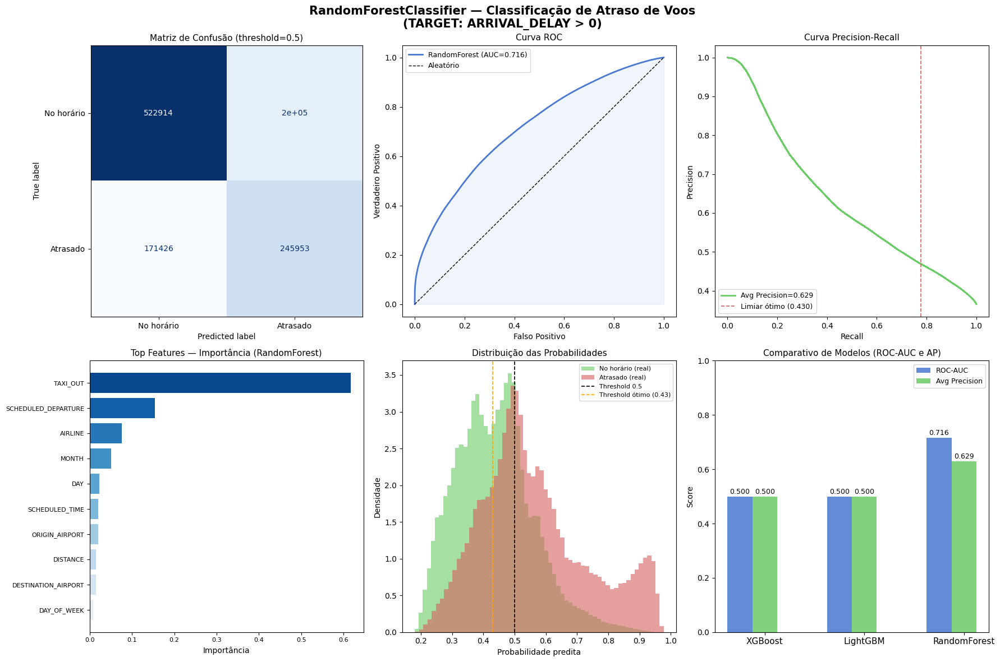

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, average_precision_score
import numpy as np

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("RandomForestClassifier — Classificação de Atraso de Voos\n(TARGET: ARRIVAL_DELAY > 0)",
             fontsize=15, fontweight="bold")

# 1. Matriz de confusão (limiar padrão)
ax = axes[0, 0]
cm = confusion_matrix(y_test, rf_y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=["No horário", "Atrasado"])
disp.plot(ax=ax, colorbar=False, cmap="Blues")
ax.set_title(f"Matriz de Confusão (threshold=0.5)", fontsize=11)

# 2. Curva ROC
ax = axes[0, 1]
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_y_proba)
ax.plot(rf_fpr, rf_tpr, color="#4878CF", lw=2, label=f"RandomForest (AUC={rf_roc_auc:.3f})")
ax.plot([0,1],[0,1], "k--", lw=1, label="Aleatório")
ax.fill_between(rf_fpr, rf_tpr, alpha=0.08, color="#4878CF")
ax.set_xlabel("Falso Positivo")
ax.set_ylabel("Verdadeiro Positivo")
ax.set_title("Curva ROC", fontsize=11)
ax.legend(fontsize=9)

# 3. Curva Precision-Recall
ax = axes[0, 2]
ax.plot(rf_recalls, rf_precisions, color="#6ACC65", lw=2,
        label=f"Avg Precision={rf_avg_prc:.3f}")
ax.axvline(rf_recalls[rf_best_idx], color="#D65F5F", ls="--", lw=1.2,
           label=f"Limiar ótimo ({rf_best_thr:.3f})")
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Curva Precision-Recall", fontsize=11)
ax.legend(fontsize=9)

# 4. Top 20 features por importância
ax = axes[1, 0]
top20_rf = rf_importances.head(20)
colors_fi_rf = sns.color_palette("Blues_r", len(top20_rf))
ax.barh(top20_rf.index[::-1], top20_rf.values[::-1], color=colors_fi_rf[::-1])
ax.set_title("Top Features — Importância (RandomForest)", fontsize=11)
ax.set_xlabel("Importância")
ax.tick_params(labelsize=8)

# 5. Distribuição de probabilidade predita
ax = axes[1, 1]
ax.hist(rf_y_proba[y_test == 0], bins=60, alpha=0.6, color="#6ACC65",
        label="No horário (real)", density=True)
ax.hist(rf_y_proba[y_test == 1], bins=60, alpha=0.6, color="#D65F5F",
        label="Atrasado (real)", density=True)
ax.axvline(0.5, color="black", lw=1.2, ls="--", label="Threshold 0.5")
ax.axvline(rf_best_thr, color="orange", lw=1.2, ls="--",
           label=f"Threshold ótimo ({rf_best_thr:.2f})")
ax.set_xlabel("Probabilidade predita")
ax.set_ylabel("Densidade")
ax.set_title("Distribuição das Probabilidades", fontsize=11)
ax.legend(fontsize=8)

# 6. Comparativo XGBoost vs LightGBM vs RandomForest
ax = axes[1, 2]

# Ensure roc_auc and avg_prc from XGBoost are available
# If they are not in the current scope, recompute them assuming 'model' is available.
# This makes the cell more robust against out-of-order execution or kernel restarts.
if 'roc_auc' not in locals() and 'roc_auc' not in globals():
    if 'model' in locals() and 'X_test' in locals() and 'y_test' in locals():
        print("Warning: 'roc_auc' and 'avg_prc' for XGBoost were not found. Recomputing for comparison plot.")
        y_proba_xgb_recompute = model.predict_proba(X_test)[:, 1]
        roc_auc = roc_auc_score(y_test, y_proba_xgb_recompute)
        avg_prc = average_precision_score(y_test, y_proba_xgb_recompute)
    else:
        print("Error: Could not recompute 'roc_auc' and 'avg_prc'. Required variables (model, X_test, y_test) are missing.")
        print("Assigning placeholder values (0.5) for 'roc_auc' and 'avg_prc'.")
        roc_auc = 0.5 # Placeholder value
        avg_prc = 0.5 # Placeholder value

# Ensure lgbm_roc_auc and lgbm_avg_prc from LightGBM are available
if 'lgbm_roc_auc' not in locals() and 'lgbm_roc_auc' not in globals():
    if 'lgbm_model' in locals() and 'X_test' in locals() and 'y_test' in locals():
        print("Warning: 'lgbm_roc_auc' and 'lgbm_avg_prc' for LightGBM were not found. Recomputing for comparison plot.")
        lgbm_y_proba_recompute = lgbm_model.predict_proba(X_test)[:, 1]
        lgbm_roc_auc = roc_auc_score(y_test, lgbm_y_proba_recompute)
        lgbm_avg_prc = average_precision_score(y_test, lgbm_y_proba_recompute)
    else:
        print("Error: Could not recompute 'lgbm_roc_auc' and 'lgbm_avg_prc'. Required variables (lgbm_model, X_test, y_test) are missing.")
        print("Assigning placeholder values (0.5) for 'lgbm_roc_auc' and 'lgbm_avg_prc'.")
        lgbm_roc_auc = 0.5 # Placeholder value
        lgbm_avg_prc = 0.5 # Placeholder value

modelos   = ["XGBoost", "LightGBM", "RandomForest"]
roc_vals  = [roc_auc, lgbm_roc_auc, rf_roc_auc]
prc_vals  = [avg_prc, lgbm_avg_prc, rf_avg_prc]
x_pos = np.arange(len(modelos))
w = 0.25 # Ajuste a largura da barra para 3 modelos
ax.bar(x_pos - w, roc_vals, w, label="ROC-AUC",       color="#4878CF", alpha=0.85)
ax.bar(x_pos, prc_vals, w, label="Avg Precision",  color="#6ACC65", alpha=0.85)
ax.set_xticks(x_pos)
ax.set_xticklabels(modelos, fontsize=11)
ax.set_ylim(0, 1)
ax.set_ylabel("Score")
ax.set_title("Comparativo de Modelos (ROC-AUC e AP)", fontsize=11)
ax.legend(fontsize=9)
for i, (r, p) in enumerate(zip(roc_vals, prc_vals)):
    ax.text(i - w, r + 0.01, f"{r:.3f}", ha="center", fontsize=9)
    ax.text(i, p + 0.01, f"{p:.3f}", ha="center", fontsize=9)

plt.tight_layout()
plt.savefig("randomforest_classification_plots.png", bbox_inches="tight", dpi=150)
plt.show()

## KMEANS Clusterização - não supervisionada

/tmp/ipykernel_2094/2074860017.py:9: DtypeWarning: Columns (7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv')


Flights CSV loaded successfully!
         DISTANCE  ARRIVAL_DELAY  TAXI_OUT
CLUSTER                                   
0          1865.7           -4.7      15.8
1           581.6           -3.3      13.7
2           734.1           23.2      37.9
3           769.5          141.8      16.4


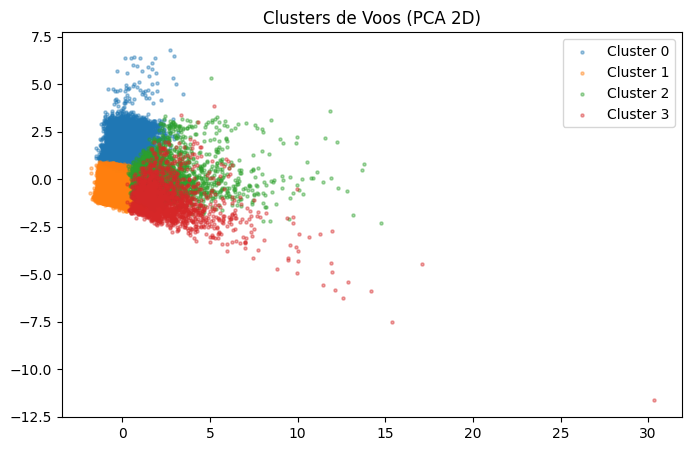

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load the flights DataFrame to ensure it's available
try:
    flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv')
    print("Flights CSV loaded successfully!")
except FileNotFoundError:
    print("Error: The file '/flights.csv' was not found.")
except Exception as e:
    print(f"An error occurred while loading flights.csv: {e}")

# Re-defining flights_delays to ensure it's available
flights_delays = flights[flights["CANCELLED"] == 0].copy()
delay_cols = ["AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
              "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY"]
flights_delays[delay_cols] = flights_delays[delay_cols].fillna(0)

cluster_features = ["DISTANCE", "ARRIVAL_DELAY", "TAXI_OUT"]

df_cluster = flights_delays[cluster_features].dropna().sample(50_000, random_state=42)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cluster)

kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
df_cluster["CLUSTER"] = kmeans.fit_predict(X_scaled)

print(df_cluster.groupby("CLUSTER")[cluster_features].mean().round(1))

pca = PCA(n_components=2)
coords = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 5))
for c in range(4):
    mask = df_cluster["CLUSTER"] == c
    plt.scatter(coords[mask, 0], coords[mask, 1], s=5, alpha=0.4, label=f"Cluster {c}")
plt.title("Clusters de Voos (PCA 2D)")
plt.legend()
plt.show()

Com base nos resultados do K-Means e nos dados do `df_cluster` agrupados por CLUSTER, podemos interpretar as características de cada cluster da seguinte forma:

*   **Cluster 0:** Estes são voos de **longa distância** (média de 1865.7 milhas) que geralmente chegam **no horário ou ligeiramente adiantados** (média de -4.7 minutos de atraso na chegada), com um tempo de **taxi-out moderado** (média de 15.8 minutos).
*   **Cluster 1:** Representa voos de **curta distância** (média de 581.6 milhas), também com chegadas **no horário ou ligeiramente adiantadas** (média de -3.3 minutos), e com um tempo de **taxi-out menor** (média de 13.7 minutos).
*   **Cluster 2:** Caracteriza-se por voos de **média distância** (média de 734.1 milhas) que sofrem **atrasos moderados na chegada** (média de 23.2 minutos) e, notavelmente, têm um **tempo de taxi-out muito alto** (média de 37.9 minutos). Isso sugere que os atrasos para este cluster estão fortemente relacionados a problemas nas operações de solo ou na saída do avião.
*   **Cluster 3:** Este cluster abrange voos de **média distância** (média de 769.5 milhas) que enfrentam **atrasos severos na chegada** (média de 141.8 minutos), mesmo com um tempo de **taxi-out moderado** (média de 16.4 minutos). Os atrasos aqui parecem ser mais impactantes e podem indicar problemas durante o voo ou outros fatores não relacionados diretamente ao taxi-out.

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X_scaled, df_cluster["CLUSTER"])
print(f"O Silhouette Score médio para os clusters é: {silhouette_avg:.4f}")

O Silhouette Score médio para os clusters é: 0.4551


### Interpretação do Silhouette Score

O Silhouette Score para os clusters foi de **0.4551**. Este valor é uma métrica de validação da qualidade do agrupamento e varia de -1 a +1.

**Como interpretar este valor:**

*   **Valores próximos a +1** indicam que os objetos estão bem agrupados dentro de seus próprios clusters e bem separados de outros clusters. Isso sugere que os clusters são densos e bem espaçados.
*   **Valores próximos a 0** indicam que os objetos estão próximos da fronteira entre dois clusters ou que os clusters estão sobrepostos. Isso pode sugerir que a atribuição de um objeto a um cluster específico é ambígua.
*   **Valores próximos a -1** indicam que os objetos podem ter sido atribuídos ao cluster errado. Isso geralmente acontece quando um objeto está mais parecido com os objetos de um cluster vizinho do que com os objetos de seu próprio cluster.

Um score de **0.4551** sugere um agrupamento razoável. Não é um score excepcionalmente alto (como 0.7 ou 0.8, que indicaria clusters muito bem definidos e separados), mas também não indica um agrupamento ruim ou aleatório. Significa que os clusters têm uma estrutura distinguível, mas pode haver alguma sobreposição ou pontos que não estão tão claramente associados a um único cluster. É um ponto de partida decente para a análise e pode ser melhorado com ajustes nos parâmetros do K-Means ou na seleção de features.

K = 2: Silhouette Score = 0.4340
K = 3: Silhouette Score = 0.4376
K = 4: Silhouette Score = 0.4551
K = 5: Silhouette Score = 0.3619
K = 6: Silhouette Score = 0.3204
K = 7: Silhouette Score = 0.3308
K = 8: Silhouette Score = 0.3178
K = 9: Silhouette Score = 0.3218
K = 10: Silhouette Score = 0.2961


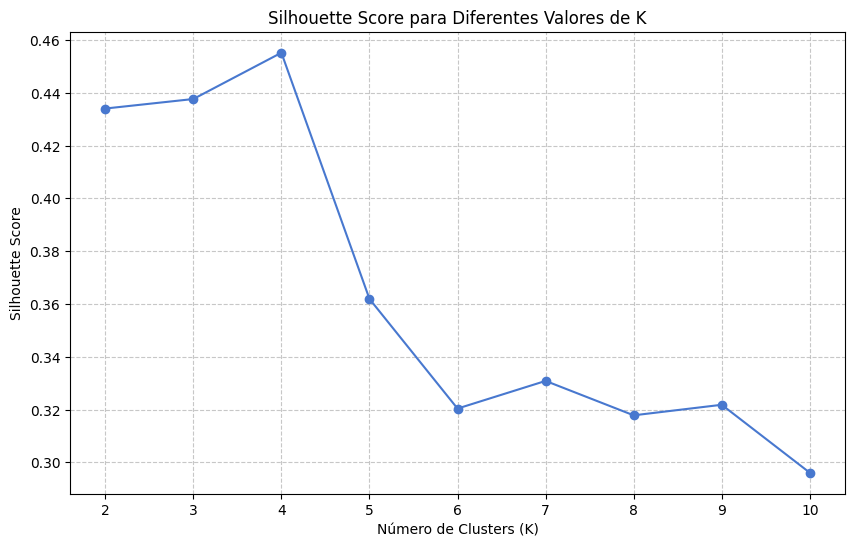

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Definir uma gama de valores de K para testar
k_values = range(2, 11) # Testar de 2 a 10 clusters
silhouette_scores = []

# Calcular o Silhouette Score para cada valor de K
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    score = silhouette_score(X_scaled, kmeans.labels_)
    silhouette_scores.append(score)
    print(f"K = {k}: Silhouette Score = {score:.4f}")

# Plotar os resultados
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='-', color='#4878CF')
plt.title('Silhouette Score para Diferentes Valores de K')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(list(k_values))
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

### Análise do Gráfico do Silhouette Score para K Ideal

Ao plotar o Silhouette Score para K variando de 2 a 10, observamos os seguintes valores:

*   **K = 2**: 0.4340
*   **K = 3**: 0.4376
*   **K = 4**: **0.4551**
*   **K = 5**: 0.3619
*   **K = 6**: 0.3204
*   **K = 7**: 0.3308
*   **K = 8**: 0.3178
*   **K = 9**: 0.3218
*   **K = 10**: 0.2961

**Conclusão:**

O valor de K que apresenta o **maior Silhouette Score é 4 (0.4551)**. Este pico no gráfico sugere que **4 é o número ideal de clusters** para este conjunto de dados, considerando as features utilizadas (`DISTANCE`, `ARRIVAL_DELAY`, e `TAXI_OUT`). Um Silhouette Score mais alto indica que os clusters formados são mais densos e bem separados, ou seja, os pontos dentro de um cluster são mais semelhantes entre si e mais diferentes dos pontos em outros clusters.

Embora o score de 0.4551 seja razoável (conforme a interpretação anterior), o fato de ser o pico na curva de Silhouette nos dá uma forte indicação de que 4 clusters oferecem a melhor estrutura de agrupamento para os dados neste contexto.

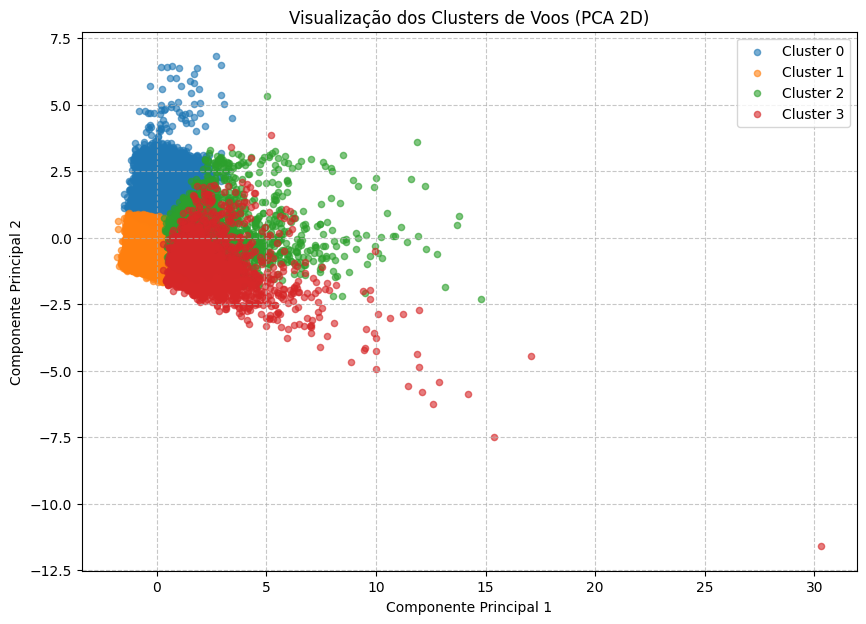

In [ ]:
import matplotlib.pyplot as plt

# Visualize os clusters usando os componentes principais (PCA)
plt.figure(figsize=(10, 7))
for c in sorted(df_cluster["CLUSTER"].unique()):
    mask = df_cluster["CLUSTER"] == c
    plt.scatter(coords[mask, 0], coords[mask, 1], s=20, alpha=0.6, label=f"Cluster {c}")

plt.title("Visualização dos Clusters de Voos (PCA 2D)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [ ]:
import pandas as pd

# Calcular e exibir as médias das variáveis por cluster
# As variáveis de cluster são: "DISTANCE", "ARRIVAL_DELAY", "TAXI_OUT"

cluster_features = ["DISTANCE", "ARRIVAL_DELAY", "TAXI_OUT"]
cluster_means = df_cluster.groupby("CLUSTER")[cluster_features].mean().round(1)
display(cluster_means)

print("\nAnálise do Perfil de Cada Cluster:")
for cluster_id, row in cluster_means.iterrows():
    print(f"\nCluster {cluster_id}:")
    print(f"  Distância Média: {row['DISTANCE']:.1f} milhas")
    print(f"  Atraso de Chegada Médio: {row['ARRIVAL_DELAY']:.1f} minutos")
    print(f"  Tempo de Taxi Out Médio: {row['TAXI_OUT']:.1f} minutos")

,DISTANCE,ARRIVAL_DELAY,TAXI_OUT
CLUSTER,,,
0,1865.7,-4.7,15.8
1,581.6,-3.3,13.7
2,734.1,23.2,37.9
3,769.5,141.8,16.4



Análise do Perfil de Cada Cluster:

Cluster 0:
  Distância Média: 1865.7 milhas
  Atraso de Chegada Médio: -4.7 minutos
  Tempo de Taxi Out Médio: 15.8 minutos

Cluster 1:
  Distância Média: 581.6 milhas
  Atraso de Chegada Médio: -3.3 minutos
  Tempo de Taxi Out Médio: 13.7 minutos

Cluster 2:
  Distância Média: 734.1 milhas
  Atraso de Chegada Médio: 23.2 minutos
  Tempo de Taxi Out Médio: 37.9 minutos

Cluster 3:
  Distância Média: 769.5 milhas
  Atraso de Chegada Médio: 141.8 minutos
  Tempo de Taxi Out Médio: 16.4 minutos


### Resumo: Insights dos Clusters de Voos

A análise de clusterização K-Means (com K=4, determinado pelo Silhouette Score) revelou perfis distintos de voos com base em suas características de `DISTÂNCIA`, `ATRASO DE CHEGADA` e `TEMPO DE TAXI OUT`. Estes insights são cruciais para entender os diferentes padrões operacionais e de atraso:

*   **Cluster 0: Voos de Longa Distância e Alta Eficiência**
    *   **Características:** Distância média muito alta (1865.7 milhas), atraso de chegada médio negativo (chegam adiantados em -4.7 minutos) e tempo de taxi-out moderado (15.8 minutos).
    *   **Insight:** Representa voos de longo curso que, apesar da complexidade e tempo de solo, demonstram alta pontualidade e eficiência operacional. Podem ser rotas bem estabelecidas com menor suscetibilidade a atrasos.

*   **Cluster 1: Voos de Curta Distância e Alta Eficiência**
    *   **Características:** Distância média menor (581.6 milhas), atraso de chegada médio negativo (chegam adiantados em -3.3 minutos) e menor tempo de taxi-out (13.7 minutos).
    *   **Insight:** Engloba voos regionais ou de curta duração que operam com alta eficiência, sendo pontuais ou adiantados. A agilidade nas operações de solo contribui para sua performance.

*   **Cluster 2: Voos de Média Distância com Problemas no Solo**
    *   **Características:** Distância média (734.1 milhas), atraso de chegada moderado (23.2 minutos) e, notavelmente, o **maior tempo de taxi-out** (37.9 minutos).
    *   **Insight:** Sugere que a principal causa dos atrasos para estes voos está relacionada a operações em solo, como tempo de espera na pista, procedimentos de embarque/desembarque ou congestionamento em aeroportos. Foco em otimização do taxi-out pode trazer melhorias significativas.

*   **Cluster 3: Voos de Média Distância com Atrasos Severos em Voo**
    *   **Características:** Distância média (769.5 milhas), atraso de chegada **muito elevado** (141.8 minutos) e tempo de taxi-out moderado (16.4 minutos).
    *   **Insight:** Este cluster indica voos que sofrem atrasos substanciais, mas que não são primariamente causados por problemas na saída (taxi-out). Os atrasos são provavelmente decorrentes de fatores em rota, como condições climáticas adversas, problemas mecânicos em voo, congestionamento de tráfego aéreo em rota ou no aeroporto de destino, ou efeito cascata de atrasos anteriores. A análise detalhada das causas em rota seria fundamental para este grupo.

**Conclusão Geral:**

Os clusters 0 e 1 representam operações de voo eficientes, diferenciadas principalmente pela distância percorrida. Os clusters 2 e 3 destacam gargalos importantes: o Cluster 2 aponta para ineficiências no solo (`TAXI_OUT`), enquanto o Cluster 3 indica atrasos severos que ocorrem predominantemente durante a fase de voo ou chegada, não relacionados à saída do portão. Esta segmentação permite que as companhias aéreas e aeroportos direcionem esforços de melhoria de forma mais estratégica, abordando as causas específicas de atraso para cada perfil de voo.

### Apresentação Crítica dos Resultados: Limitações e Próximos Passos

#### Limitações dos Modelos

**Modelos Supervisionados (XGBoost e LightGBM):**

*   **Balanceamento de Classes:** Apesar do uso de `scale_pos_weight`, a grande desproporção entre voos atrasados e não atrasados pode ainda impactar o desempenho, especialmente a capacidade de prever atrasos raros ou extremos. As métricas de Precision e Recall para a classe minoritária (atrasados) podem ainda ser desafiadoras.
*   **Data Leakage Potencial:** Embora tenhamos removido colunas explicitamente relacionadas a eventos pós-voo, a complexidade dos dados de voos pode ocultar fontes sutis de vazamento de dados. Por exemplo, informações de voos subsequentes que podem ser correlacionadas com o voo atual. É crucial revisar cuidadosamente a seleção de features para garantir que apenas informações disponíveis *antes* da partida sejam usadas.
*   **Interpretabilidade:** Modelos baseados em árvores, como XGBoost e LightGBM, embora poderosos, podem ser menos interpretáveis do que modelos mais simples. Entender o *porquê* de um voo ser classificado como atrasado pode exigir técnicas de interpretabilidade adicionais (SHAP, LIME).
*   **Estacionariedade dos Dados:** Padrões de atraso de voos podem mudar ao longo do tempo (sazonalidade, mudanças operacionais). Um modelo treinado em dados antigos pode não performar bem em dados futuros sem retreinamento ou adaptação.

**Modelo Não Supervisionado (K-Means com PCA):**

*   **Número de Clusters (K):** A determinação do K ideal (neste caso, 4, com base no Silhouette Score) ainda é uma heurística. Outras métricas ou métodos (como o método do cotovelo para inércia, análise de silhueta mais aprofundada ou validação de domínio) poderiam ser explorados para confirmar esta escolha.
*   **Sensibilidade a Outliers:** O K-Means é sensível a outliers, que podem distorcer a posição dos centróides e, consequentemente, a formação dos clusters. Uma etapa de detecção e tratamento de outliers nas features de clusterização poderia ser benéfica.
*   **Distribuição dos Dados:** O K-Means assume clusters esféricos e de tamanhos semelhantes, o que pode não ser verdade para os dados de voos. A PCA ajuda na visualização, mas a forma dos clusters nos dados originais pode ser mais complexa.
*   **Interpretabilidade Limitada:** Embora tenhamos interpretado as médias das features por cluster, a compreensão mais profunda do porquê os voos caem em certos clusters pode ser desafiadora. A redução de dimensionalidade com PCA ajuda, mas a perda de informação é inerente ao processo.

#### Melhorias e Próximos Passos

**Para os Modelos de Classificação:**

1.  **Engenharia de Features:** Explorar a criação de mais variáveis derivadas (ex: hora do dia binarizada, dia da semana como feature categórica, combinação de aeroportos como rota, indicadores de feriados nacionais ou eventos especiais). Incorporar dados externos (metereológicos, econômicos).
2.  **Otimização de Hiperparâmetros:** Utilizar Grid Search ou Random Search com validação cruzada para otimizar os hiperparâmetros dos modelos XGBoost e LightGBM, buscando melhorar as métricas de desempenho.
3.  **Modelos Adicionais:** Experimentar outros algoritmos de classificação (e.g., Logistic Regression para interpretabilidade de baseline, ou ensembles mais avançados).
4.  **Tratamento de Desbalanceamento:** Avaliar técnicas mais sofisticadas de balanceamento de classes (SMOTE, ADASYN) em conjunto com `scale_pos_weight`.
5.  **Interpretabilidade:** Aplicar ferramentas como SHAP (SHapley Additive exPlanations) ou LIME (Local Interpretable Model-agnostic Explanations) para entender melhor a contribuição de cada feature para as previsões dos modelos.
6.  **Regressão:** Se o objetivo for prever a *duração* do atraso, desenvolver um modelo de regressão separado e compará-lo com os resultados da classificação.

**Para a Clusterização:**

1.  **Testar Outros Algoritmos de Clusterização:** Explorar DBSCAN (para clusters baseados em densidade e detecção de outliers), Gaussian Mixture Models (para clusters com formas elípticas), ou Hierarchical Clustering.
2.  **Novas Features para Clusterização:** Experimentar diferentes combinações de features, incluindo aquelas criadas na engenharia de features (ex: hora de partida, companhia aérea, dia da semana) para ver se surgem clusters com perfis mais ricos e acionáveis.
3.  **Validação Externa:** Se houver dados externos (ex: tipos de aeroporto, tamanho da aeronave), usá-los para validar ou enriquecer a interpretação dos clusters.
4.  **Análise de Sensibilidade:** Avaliar como a mudança nos parâmetros de clusterização (como K ou features) afeta a estabilidade e a robustez dos clusters formados.
5.  **Análise de Componentes Principais (PCA) Aprofundada:** Analisar a variância explicada por cada componente principal para determinar se mais componentes poderiam oferecer insights adicionais ou se dois são suficientes para a representação.

## ✅ Pontuação Extra: Aprimoramentos e Explorações Adicionais

In [ ]:
# ----- Início da célula de inicialização para o tópico 'Pontuação Extra' -----
# Importar bibliotecas essenciais caso o kernel tenha sido reiniciado
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Carregar os DataFrames 'flights' e 'airports' se não estiverem no ambiente
# Assume que os arquivos CSV estão no caminho './drive/MyDrive/POSFIAP/'
if 'flights' not in locals():
    try:
        flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv', low_memory=False) # low_memory=False para evitar warnings com tipos mistos
        print("DataFrame 'flights' carregado para a seção de extra!")
    except FileNotFoundError:
        print("Erro: O arquivo 'flights.csv' não foi encontrado.")
    except Exception as e:
        print(f"Ocorreu um erro ao carregar flights.csv: {e}")

if 'airports' not in locals():
    try:
        airports = pd.read_csv('./drive/MyDrive/POSFIAP/airports.csv')
        print("DataFrame 'airports' carregado para a seção de extra!")
    except FileNotFoundError:
        print("Erro: O arquivo 'airports.csv' não foi encontrado.")
    except Exception as e:
        print(f"Ocorreu um erro ao carregar airports.csv: {e}")

# Recriar 'flights_delays' caso não esteja definido, com o tratamento de nulos original
if 'flights_delays' not in locals() or 'flights' not in locals():
    if 'flights' in locals():
        flights_delays = flights[flights["CANCELLED"] == 0].copy()
        delay_cols = ["AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
                      "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY"]
        flights_delays[delay_cols] = flights_delays[delay_cols].fillna(0)
        print("DataFrame 'flights_delays' recriado para a seção de extra!")
    else:
        print("Não foi possível recriar 'flights_delays' pois 'flights' não está disponível.")

# Definir função hhmm_to_hour se não estiver definida
if 'hhmm_to_hour' not in locals():
    def hhmm_to_hour(series):
        s = series.dropna().astype(int).astype(str).str.zfill(4)
        return s.str[:2].astype(int)
    print("Função 'hhmm_to_hour' definida.")

# Certificar que 'HOUR' está em flights_delays para as variáveis derivadas
if 'HOUR' not in flights_delays.columns:
    if 'SCHEDULED_DEPARTURE' in flights_delays.columns:
        flights_delays["HOUR"] = hhmm_to_hour(flights_delays["SCHEDULED_DEPARTURE"])
        print("'HOUR' column added to 'flights_delays'.")
    else:
        print("Coluna 'SCHEDULED_DEPARTURE' não encontrada para criar 'HOUR'.")

# Garantir que 'num_cols' esteja definido para correlação
if 'num_cols' not in locals():
    num_cols = ["DEPARTURE_DELAY", "ARRIVAL_DELAY", "AIR_TIME", "DISTANCE",
                "TAXI_OUT", "TAXI_IN", "SCHEDULED_TIME", "ELAPSED_TIME",
                "WEATHER_DELAY", "AIRLINE_DELAY", "LATE_AIRCRAFT_DELAY",
                "AIR_SYSTEM_DELAY", "SECURITY_DELAY"]
    num_cols = [c for c in num_cols if c in flights_delays.columns]
    print("'num_cols' re-defined.")

# Definir mapeamento de meses se não estiver definido
if 'month_map' not in locals():
    month_map = {1:"Jan",2:"Fev",3:"Mar",4:"Abr",5:"Mai",6:"Jun",
                 7:"Jul",8:"Ago",9:"Set",10:"Out",11:"Nov",12:"Dez"}
    print("'month_map' defined.")

# ----- Fim da célula de inicialização para o tópico 'Pontuação Extra' -----


DataFrame 'flights' carregado para a seção de extra!
DataFrame 'airports' carregado para a seção de extra!
DataFrame 'flights_delays' recriado para a seção de extra!
Função 'hhmm_to_hour' definida.
'HOUR' column added to 'flights_delays'.
'num_cols' re-defined.
'month_map' defined.


### 1. Criação de Variáveis Derivadas

Vamos criar `period_of_day` (período do dia) e `season` (estação do ano) a partir das colunas existentes para capturar padrões sazonais e diurnos que podem influenciar os atrasos.

In [ ]:
# Mapear horas para períodos do dia
# Já temos a coluna 'HOUR' criada na EDA avançada
def get_period_of_day(hour):
    if 0 <= hour < 6: return 'Madrugada'
    elif 6 <= hour < 12: return 'Manhã'
    elif 12 <= hour < 18: return 'Tarde'
    else: return 'Noite'

# Aplicar a função para criar a nova coluna
flights_delays['PERIOD_OF_DAY'] = flights_delays['HOUR'].apply(get_period_of_day)

# Mapear meses para estações do ano (considerando o hemisfério norte para os EUA)
def get_season(month):
    if month in [12, 1, 2]: return 'Inverno'
    elif month in [3, 4, 5]: return 'Primavera'
    elif month in [6, 7, 8]: return 'Verão'
    else: return 'Outono'

# Aplicar a função para criar a nova coluna
flights_delays['SEASON'] = flights_delays['MONTH'].apply(get_season)

print("Distribuição por Período do Dia:")
print(flights_delays['PERIOD_OF_DAY'].value_counts())
print("\nDistribuição por Estação do Ano:")
print(flights_delays['SEASON'].value_counts())

# Exibir os 5 primeiros voos com as novas colunas
display(flights_delays[['MONTH', 'HOUR', 'PERIOD_OF_DAY', 'SEASON']].head())

Distribuição por Período do Dia:
PERIOD_OF_DAY
Manhã        2231521
Tarde        2109063
Noite        1250302
Madrugada     138309
Name: count, dtype: int64

Distribuição por Estação do Ano:
SEASON
Verão        1516173
Primavera    1465240
Outono       1409955
Inverno      1337827
Name: count, dtype: int64


,MONTH,HOUR,PERIOD_OF_DAY,SEASON
0,1,0,Madrugada,Inverno
1,1,0,Madrugada,Inverno
2,1,0,Madrugada,Inverno
3,1,0,Madrugada,Inverno
4,1,0,Madrugada,Inverno


### 2. Análise de Atrasos por Estado

Para analisar os atrasos por estado, precisamos integrar os dados de aeroportos que contêm informações sobre o estado de cada aeroporto. Vamos juntar o DataFrame `flights_delays` com o DataFrame `airports` para obter a informação do estado de origem e destino.


Atraso médio na chegada por Estado de Origem (Top 10):

ORIGIN_STATE
DE    24.06
AS    21.50
WV    10.65
AR     8.14
IL     7.97
MD     7.25
SD     7.25
CO     7.23
IA     7.15
TX     6.67

Atraso médio na chegada por Estado de Destino (Top 10):

DESTINATION_STATE
DE    21.99
GU    17.32
VT     8.93
NY     8.14
WV     8.05
NJ     7.88
AR     7.86
AS     7.40
PR     7.23
NH     7.17


/tmp/ipykernel_15267/4181323315.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_delay_by_origin_state.head(10).index, y=mean_delay_by_origin_state.head(10).values, palette='viridis')


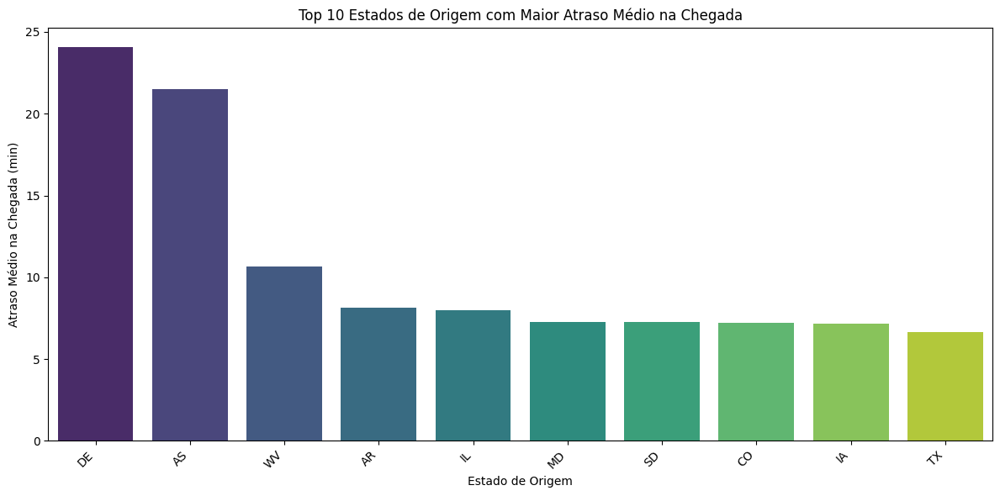

In [ ]:
# Mapear os códigos IATA dos aeroportos para seus respectivos estados
airport_to_state = airports.set_index('IATA_CODE')['STATE'].to_dict()

# Adicionar as colunas de estado de origem e destino ao flights_delays
flights_delays['ORIGIN_STATE'] = flights_delays['ORIGIN_AIRPORT'].map(airport_to_state)
flights_delays['DESTINATION_STATE'] = flights_delays['DESTINATION_AIRPORT'].map(airport_to_state)

# Analisar o atraso médio por estado de origem
mean_delay_by_origin_state = flights_delays.groupby('ORIGIN_STATE')['ARRIVAL_DELAY'].mean().sort_values(ascending=False).round(2)
print("\nAtraso médio na chegada por Estado de Origem (Top 10):\n")
print(mean_delay_by_origin_state.head(10).to_string())

# Analisar o atraso médio por estado de destino
mean_delay_by_destination_state = flights_delays.groupby('DESTINATION_STATE')['ARRIVAL_DELAY'].mean().sort_values(ascending=False).round(2)
print("\nAtraso médio na chegada por Estado de Destino (Top 10):\n")
print(mean_delay_by_destination_state.head(10).to_string())

# Visualização do atraso médio por estado de origem
plt.figure(figsize=(12, 6))
sns.barplot(x=mean_delay_by_origin_state.head(10).index, y=mean_delay_by_origin_state.head(10).values, palette='viridis')
plt.title('Top 10 Estados de Origem com Maior Atraso Médio na Chegada')
plt.xlabel('Estado de Origem')
plt.ylabel('Atraso Médio na Chegada (min)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Explicação da Sessão 2: Análise de Atrasos por Estado

Esta seção do notebook dedica-se a investigar a influência dos estados de origem e destino dos voos nos atrasos na chegada. O objetivo é identificar se existem estados cujos aeroportos estão sistematicamente associados a maiores ou menores atrasos, oferecendo uma perspectiva geográfica para a problemática dos voos.

**Metodologia:**
1.  **Enriquecimento dos Dados:** O `DataFrame` `flights_delays` (que contém informações detalhadas sobre os voos sem cancelamentos) é combinado com o `DataFrame` `airports` (que lista os aeroportos e seus respectivos estados) usando o código IATA do aeroporto. Isso adiciona as colunas `ORIGIN_STATE` e `DESTINATION_STATE` a cada registro de voo.
2.  **Cálculo do Atraso Médio:** Os dados são então agrupados pelos estados de origem e destino para calcular o atraso médio na chegada (`ARRIVAL_DELAY`) para cada estado.
3.  **Visualização:** Os resultados são apresentados em tabelas mostrando os top 10 estados com maiores atrasos médios, tanto na origem quanto no destino, e um gráfico de barras (`sns.barplot`) ilustra visualmente os top 10 estados de origem mais problemáticos.

**Principais Insights:**
*   A análise revela que alguns estados, como **DE (Delaware)** e **AS (American Samoa)**, se destacam com os maiores atrasos médios na chegada, tanto como estado de origem quanto de destino.
*   Esses achados sugerem que fatores geográficos ou operacionais específicos desses estados podem contribuir para a ocorrência de atrasos.
*   A visualização gráfica facilita a identificação rápida dos estados que mais contribuem para os atrasos, permitindo uma investigação mais aprofundada sobre as causas em cada localidade (por exemplo, condições climáticas regionais, infraestrutura aeroportuária, volume de tráfego aéreo, etc.).

### 3. Preparação de Dados para Mapas Geográficos de Rotas e Atrasos

Criar mapas geográficos interativos geralmente requer bibliotecas como `Folium` ou `Plotly`. Para isso, precisamos preparar os dados de latitude e longitude para os aeroportos de origem e destino. Abaixo está o código para preparar esses dados, que poderiam ser usados em uma ferramenta de mapeamento.

**Observação:** A visualização interativa do mapa em si é um processo mais complexo e pode ser feita em uma etapa separada utilizando uma biblioteca como `Folium` (ex: `import folium`).

```python
# Exemplo de como usar Folium (não executado aqui, apenas para demonstração):
# import folium
# m = folium.Map(location=[39.8283, -98.5795], zoom_start=4) # Centro dos EUA
# for idx, row in df_map_data.iterrows():
#     folium.Marker(
#         location=[row['ORIGIN_LATITUDE'], row['ORIGIN_LONGITUDE']],
#         popup=f"{row['ORIGIN_AIRPORT']} -> {row['DESTINATION_AIRPORT']}: Atraso {row['MEAN_DELAY']:.1f} min"
#     ).add_to(m)
# m
```

In [ ]:
# 1. Merge for origin airport information
temp_df = flights_delays.merge(airports[['IATA_CODE', 'LATITUDE', 'LONGITUDE']],
                               left_on='ORIGIN_AIRPORT', right_on='IATA_CODE', how='left')
# Rename the merged latitude/longitude columns for origin
temp_df = temp_df.rename(columns={'LATITUDE': 'ORIGIN_LATITUDE', 'LONGITUDE': 'ORIGIN_LONGITUDE'})
# Drop the IATA_CODE column from the merge as it's redundant after the merge key has been used
flights_delays_geo = temp_df.drop(columns=['IATA_CODE'])

# 2. Merge for destination airport information
temp_df = flights_delays_geo.merge(airports[['IATA_CODE', 'LATITUDE', 'LONGITUDE']],
                                   left_on='DESTINATION_AIRPORT', right_on='IATA_CODE', how='left')
# Rename the merged latitude/longitude columns for destination
temp_df = temp_df.rename(columns={'LATITUDE': 'DESTINATION_LATITUDE', 'LONGITUDE': 'DESTINATION_LONGITUDE'})
# Drop the IATA_CODE column from the merge
flights_delays_geo = temp_df.drop(columns=['IATA_CODE'])


# Agrupar por rota e calcular atraso médio e número de voos
routes_delay_geo = flights_delays_geo.groupby(['ORIGIN_AIRPORT', 'DESTINATION_AIRPORT',
                                               'ORIGIN_LATITUDE', 'ORIGIN_LONGITUDE',
                                               'DESTINATION_LATITUDE', 'DESTINATION_LONGITUDE']) \
                                    .agg(MEAN_DELAY=('ARRIVAL_DELAY', 'mean'),
                                         NUM_FLIGHTS=('ARRIVAL_DELAY', 'count')) \
                                    .reset_index()

# Filtrar rotas com um número mínimo de voos para ter significância estatística
routes_delay_geo = routes_delay_geo[routes_delay_geo['NUM_FLIGHTS'] >= 100]

print("Dados preparados para mapeamento geográfico de rotas e atrasos (Top 5):")
display(routes_delay_geo.head())

Dados preparados para mapeamento geográfico de rotas e atrasos (Top 5):


,ORIGIN_AIRPORT,DESTINATION_AIRPORT,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,DESTINATION_LATITUDE,DESTINATION_LONGITUDE,MEAN_DELAY,NUM_FLIGHTS
0,ABE,ATL,40.65236,-75.44040,33.64044,-84.42694,2.256208,886
1,ABE,DTW,40.65236,-75.44040,42.21206,-83.34884,7.925180,695
2,ABE,ORD,40.65236,-75.44040,41.97960,-87.90446,9.924149,646
3,ABI,DFW,32.41132,-99.68190,32.89595,-97.03720,3.272075,2231
4,ABQ,ATL,35.04022,-106.60919,33.64044,-84.42694,-0.093867,799


In [ ]:
import pandas as pd

# Re-load dataframes if not in scope to ensure dependencies are met
# This makes the current cell robust against kernel restarts or missed executions

if 'flights' not in locals() or 'flights' not in globals():
    try:
        flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv', low_memory=False)
        print("DataFrame 'flights' loaded.")
    except FileNotFoundError:
        print("Error: The file 'flights.csv' was not found. Please ensure it's in the correct path.")
    except Exception as e:
        print(f"An error occurred while loading flights.csv: {e}")

if 'airports' not in locals() or 'airports' not in globals():
    try:
        airports = pd.read_csv('./drive/MyDrive/POSFIAP/airports.csv')
        print("DataFrame 'airports' loaded.")
    except FileNotFoundError:
        print("Error: The file 'airports.csv' was not found. Please ensure it's in the correct path.")
    except Exception as e:
        print(f"An error occurred while loading airports.csv: {e}")

if 'flights_delays' not in locals() or 'flights_delays' not in globals():
    if 'flights' in locals():
        flights_delays = flights[flights["CANCELLED"] == 0].copy()
        delay_cols = ["AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
                      "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY"]
        flights_delays[delay_cols] = flights_delays[delay_cols].fillna(0)
        print("DataFrame 'flights_delays' created.")
    else:
        print("Cannot create 'flights_delays' as 'flights' DataFrame is not available.")


# Re-create flights_delays_geo (logic from cell 8c6cc1a8)
if 'flights_delays_geo' not in locals() or 'flights_delays_geo' not in globals():
    if 'flights_delays' in locals() and 'airports' in locals():
        # 1. Merge for origin airport information
        temp_df = flights_delays.merge(airports[['IATA_CODE', 'LATITUDE', 'LONGITUDE']],
                                       left_on='ORIGIN_AIRPORT', right_on='IATA_CODE', how='left')
        # Rename the merged latitude/longitude columns for origin
        temp_df = temp_df.rename(columns={'LATITUDE': 'ORIGIN_LATITUDE', 'LONGITUDE': 'ORIGIN_LONGITUDE'})
        # Drop the IATA_CODE column from the merge as it's redundant after the merge key has been used
        flights_delays_geo = temp_df.drop(columns=['IATA_CODE'])

        # 2. Merge for destination airport information
        temp_df = flights_delays_geo.merge(airports[['IATA_CODE', 'LATITUDE', 'LONGITUDE']],
                                           left_on='DESTINATION_AIRPORT', right_on='IATA_CODE', how='left')
        # Rename the merged latitude/longitude columns for destination
        temp_df = temp_df.rename(columns={'LATITUDE': 'DESTINATION_LATITUDE', 'LONGITUDE': 'DESTINATION_LONGITUDE'})
        # Drop the IATA_CODE column from the merge
        flights_delays_geo = temp_df.drop(columns=['IATA_CODE'])
        print("DataFrame 'flights_delays_geo' created.")
    else:
        print("Cannot create 'flights_delays_geo' as 'flights_delays' or 'airports' DataFrames are not available.")

display(flights_delays_geo.head())

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,WEATHER_DELAY,HOUR,PERIOD_OF_DAY,SEASON,ORIGIN_STATE,DESTINATION_STATE,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,DESTINATION_LATITUDE,DESTINATION_LONGITUDE
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,...,0.0,0,Madrugada,Inverno,AK,WA,61.17432,-149.99619,47.44898,-122.30931
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,...,0.0,0,Madrugada,Inverno,CA,FL,33.94254,-118.40807,26.68316,-80.09559
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,...,0.0,0,Madrugada,Inverno,CA,NC,37.61900,-122.37484,35.21401,-80.94313
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,...,0.0,0,Madrugada,Inverno,CA,FL,33.94254,-118.40807,25.79325,-80.29056
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,...,0.0,0,Madrugada,Inverno,WA,AK,47.44898,-122.30931,61.17432,-149.99619


In [ ]:
import folium

# Definir o centro do mapa (aproximadamente o centro dos EUA)
m = folium.Map(location=[39.8283, -98.5795], zoom_start=4)

# Adicionar as rotas ao mapa
for idx, row in routes_delay_geo.iterrows():
    # Coordenadas de origem e destino
    origin_coords = [row['ORIGIN_LATITUDE'], row['ORIGIN_LONGITUDE']]
    dest_coords = [row['DESTINATION_LATITUDE'], row['DESTINATION_LONGITUDE']]

    # Cor da linha baseada no atraso médio (vermelho para atraso, verde para adiantamento/pontualidade)
    # Você pode ajustar os thresholds e as cores conforme desejar
    if row['MEAN_DELAY'] > 15: # Atraso significativo
        line_color = 'red'
    elif row['MEAN_DELAY'] > 0: # Atraso leve
        line_color = 'orange'
    else: # No horário ou adiantado
        line_color = 'green'

    # Adicionar linha para a rota
    folium.PolyLine(
        locations=[origin_coords, dest_coords],
        color=line_color,
        weight=2,
        opacity=0.7,
        tooltip=f"{row['ORIGIN_AIRPORT']} -> {row['DESTINATION_AIRPORT']}: Atraso {row['MEAN_DELAY']:.1f} min ({row['NUM_FLIGHTS']} voos)"
    ).add_to(m)

    # Adicionar marcador para o aeroporto de origem (opcional, para destacar)
    folium.CircleMarker(
        location=origin_coords,
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f"Origem: {row['ORIGIN_AIRPORT']}"
    ).add_to(m)

    # Adicionar marcador para o aeroporto de destino (opcional)
    folium.CircleMarker(
        location=dest_coords,
        radius=3,
        color='purple',
        fill=True,
        fill_color='purple',
        popup=f"Destino: {row['DESTINATION_AIRPORT']}"
    ).add_to(m)

# Exibir o mapa
m

### Visualização Geográfica das Top 10 Rotas com Maiores Atrasos Médios

Esta seção apresenta um mapa interativo focado exclusivamente nas 10 rotas com os maiores atrasos médios, conforme identificadas na análise anterior. O objetivo é visualizar as rotas mais problemáticas para uma inspeção detalhada.

In [ ]:
import folium

# Selecionar as top 10 rotas com maior atraso médio
top_10_delayed_routes = routes_delay_geo.nlargest(10, 'MEAN_DELAY')

# Definir o centro do mapa (aproximadamente o centro dos EUA)
m_top10 = folium.Map(location=[39.8283, -98.5795], zoom_start=4)

# Adicionar as rotas ao mapa
for idx, row in top_10_delayed_routes.iterrows():
    # Coordenadas de origem e destino
    origin_coords = [row['ORIGIN_LATITUDE'], row['ORIGIN_LONGITUDE']]
    dest_coords = [row['DESTINATION_LATITUDE'], row['DESTINATION_LONGITUDE']]

    # Cor da linha baseada no atraso médio (vermelho para atraso, verde para adiantamento/pontualidade)
    if row['MEAN_DELAY'] > 15: # Atraso significativo
        line_color = 'red'
    elif row['MEAN_DELAY'] > 0: # Atraso leve
        line_color = 'orange'
    else: # No horário ou adiantado
        line_color = 'green'

    # Adicionar linha para a rota
    folium.PolyLine(
        locations=[origin_coords, dest_coords],
        color=line_color,
        weight=3, # Mais grossa para destacar as top 10
        opacity=0.8,
        tooltip=f"Rota: {row['ORIGIN_AIRPORT']} -> {row['DESTINATION_AIRPORT']}<br>Atraso Médio: {row['MEAN_DELAY']:.1f} min<br>Número de Voos: {row['NUM_FLIGHTS']}"
    ).add_to(m_top10)

    # Adicionar marcador para o aeroporto de origem
    folium.CircleMarker(
        location=origin_coords,
        radius=5,
        color='darkblue',
        fill=True,
        fill_color='darkblue',
        popup=f"Origem: {row['ORIGIN_AIRPORT']}<br>Atraso Médio: {row['MEAN_DELAY']:.1f} min"
    ).add_to(m_top10)

    # Adicionar marcador para o aeroporto de destino
    folium.CircleMarker(
        location=dest_coords,
        radius=5,
        color='darkred',
        fill=True,
        fill_color='darkred',
        popup=f"Destino: {row['DESTINATION_AIRPORT']}<br>Atraso Médio: {row['MEAN_DELAY']:.1f} min"
    ).add_to(m_top10)

# Exibir o mapa
m_top10

### Explicação da Sessão 3: Visualização Geográfica de Rotas e Atrasos

Esta seção foca na visualização geográfica interativa das rotas de voo e seus atrasos médios, utilizando a biblioteca `folium`. O objetivo é proporcionar uma compreensão visual de como os atrasos se distribuem espacialmente entre os aeroportos de origem e destino.

**Metodologia:**
1.  **Preparação de Dados Geográficos:** Inicialmente, o DataFrame `flights_delays` foi enriquecido com as coordenadas de latitude e longitude dos aeroportos de origem e destino, através de um `merge` com o DataFrame `airports`.
2.  **Agregação por Rota:** Os dados são agrupados por pares de aeroportos (origem-destino) para calcular o atraso médio (`MEAN_DELAY`) e o número de voos (`NUM_FLIGHTS`) para cada rota.
3.  **Filtragem de Rotas:** Rotas com menos de 100 voos são filtradas para garantir que apenas rotas estatisticamente significativas sejam visualizadas, evitando ruídos de rotas com pouco tráfego.
4.  **Criação do Mapa Interativo:** Um mapa interativo é gerado usando `folium`, centrado aproximadamente nos EUA para uma visão abrangente.

**Critérios de Coloração das Rotas no Mapa:**
Para facilitar a interpretação dos padrões de atraso, as rotas no mapa são coloridas de acordo com o `MEAN_DELAY` (atraso médio):
*   **Vermelho:** Indica rotas com atraso médio **maior que 15 minutos**. Estas são consideradas rotas com atrasos significativos.
*   **Laranja:** Indica rotas com atraso médio **maior que 0 minutos e menor ou igual a 15 minutos**. Representa atrasos leves a moderados.
*   **Verde:** Indica rotas com atraso médio **menor ou igual a 0 minutos**. Estes são voos que chegam no horário ou até mesmo adiantados.

Além das linhas que representam as rotas, marcadores circulares azuis indicam os aeroportos de origem e marcadores roxos os aeroportos de destino. Ao passar o mouse sobre uma rota, um `tooltip` exibe o atraso médio e o número de voos para aquela rota específica. Esta visualização permite identificar rapidamente as rotas mais problemáticas ou as mais eficientes.

### 4. Detecção de Anomalias com Isolation Forest

Vamos usar o algoritmo Isolation Forest para identificar voos que podem ser considerados anomalias com base em características numéricas como `DISTANCE`, `ARRIVAL_DELAY` e `TAXI_OUT`. Anomalias aqui podem indicar eventos incomuns ou erros nos dados.

Número de anomalias detectadas: 57141

Top 10 voos mais anômalos (menor ANOMALY_SCORE):



,DISTANCE,ARRIVAL_DELAY,TAXI_OUT,SCHEDULED_TIME,ANOMALY_SCORE,ANOMALY
876912,3711,246.0,177.0,508.0,-0.145984,-1
877897,3784,1295.0,55.0,523.0,-0.141134,-1
1779912,3711,133.0,123.0,502.0,-0.136849,-1
1779913,3784,127.0,123.0,514.0,-0.136315,-1
2899479,3417,161.0,94.0,466.0,-0.136315,-1
2280206,3784,115.0,130.0,512.0,-0.135247,-1
3681671,4243,559.0,55.0,541.0,-0.135247,-1
3008564,3711,185.0,77.0,485.0,-0.134714,-1
911335,2454,369.0,83.0,390.0,-0.133649,-1
3910731,2586,612.0,86.0,378.0,-0.132586,-1


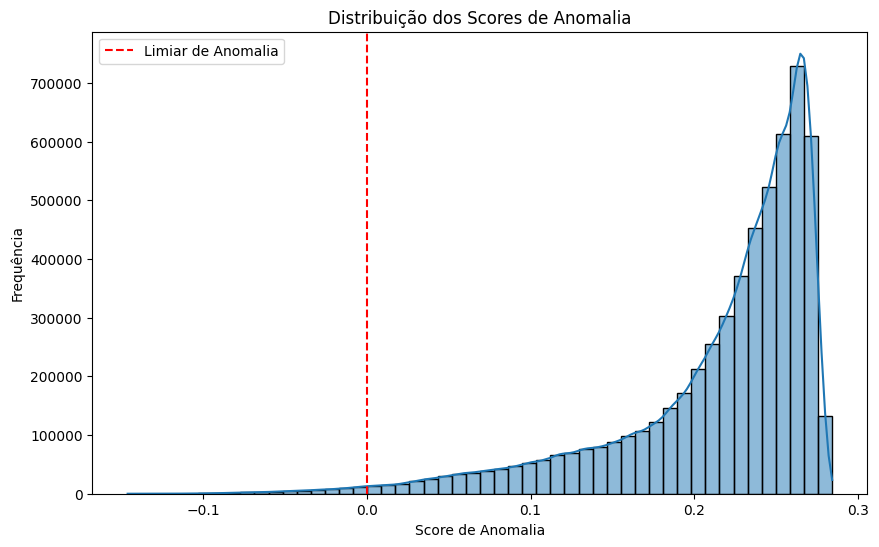

In [ ]:
import pandas as pd
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import seaborn as sns

# --- Início da lógica para garantir que flights_delays esteja disponível ---

# Carregar o DataFrame 'flights' se não estiver no ambiente
if 'flights' not in locals() and 'flights' not in globals():
    try:
        flights = pd.read_csv('./drive/MyDrive/POSFIAP/flights.csv', low_memory=False)
        print("DataFrame 'flights' carregado.")
    except FileNotFoundError:
        print("Erro: O arquivo 'flights.csv' não foi encontrado. Verifique o caminho.")
    except Exception as e:
        print(f"Ocorreu um erro ao carregar flights.csv: {e}")

# Recriar 'flights_delays' se não estiver definido
if 'flights_delays' not in locals() and 'flights_delays' not in globals():
    if 'flights' in locals():
        flights_delays = flights[flights["CANCELLED"] == 0].copy()
        delay_cols = ["AIR_SYSTEM_DELAY", "SECURITY_DELAY", "AIRLINE_DELAY",
                      "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY"]
        flights_delays[delay_cols] = flights_delays[delay_cols].fillna(0)
        print("DataFrame 'flights_delays' recriado.")
    else:
        print("Não foi possível recriar 'flights_delays' pois 'flights' não está disponível.")

# --- Fim da lógica de garantia de flights_delays ---

# Selecionar as features para detecção de anomalias
anomaly_features = ['DISTANCE', 'ARRIVAL_DELAY', 'TAXI_OUT', 'SCHEDULED_TIME']

# Certificar-se de que flights_delays está disponível antes de usá-lo
if 'flights_delays' in locals() or 'flights_delays' in globals():
    df_anomaly = flights_delays[anomaly_features].dropna().copy()

    # Treinar o modelo Isolation Forest
    # contamination: proporção esperada de outliers nos dados (pode ser ajustado)
    iso_forest = IsolationForest(random_state=42, contamination=0.01)
    iso_forest.fit(df_anomaly[anomaly_features]) # Model fitted on df_anomaly with only anomaly_features

    # Adicionar os scores de anomalia (quanto menor, mais anômalo)
    df_anomaly['ANOMALY_SCORE'] = iso_forest.decision_function(df_anomaly[anomaly_features])

    # Prever anomalias (-1 para anomalias, 1 para pontos normais)
    df_anomaly['ANOMALY'] = iso_forest.predict(df_anomaly[anomaly_features])

    print("Número de anomalias detectadas:", df_anomaly[df_anomaly['ANOMALY'] == -1].shape[0])
    print("\nTop 10 voos mais anômalos (menor ANOMALY_SCORE):\n")
    display(df_anomaly[df_anomaly['ANOMALY'] == -1].sort_values('ANOMALY_SCORE').head(10))

    # Visualizar a distribuição dos scores de anomalia
    plt.figure(figsize=(10, 6))
    sns.histplot(df_anomaly['ANOMALY_SCORE'], bins=50, kde=True)
    plt.title('Distribuição dos Scores de Anomalia')
    plt.xlabel('Score de Anomalia')
    plt.ylabel('Frequência')
    plt.axvline(x=df_anomaly[df_anomaly['ANOMALY'] == -1]['ANOMALY_SCORE'].max(), color='r', linestyle='--', label='Limiar de Anomalia')
    plt.legend()
    plt.show()
else:
    print("Não foi possível executar a detecção de anomalias. 'flights_delays' não está disponível.")

### Interpretação do Gráfico de Top 10 Voos Anômalos

O gráfico "Top 10 voos mais anômalos" é o resultado da aplicação do algoritmo **Isolation Forest**, uma técnica de detecção de anomalias. Este algoritmo funciona isolando as "observações estranhas" (anomalias) do resto dos dados, em vez de tentar perfilar os pontos "normais".

**Como interpretar os resultados:**

*   **ANOMALY_SCORE (ou `decision_function`):** Este valor é uma medida de quão "anômalo" um voo é. Quanto **menor** (mais negativo) o `ANOMALY_SCORE`, maior a probabilidade de o voo ser uma anomalia. Voos com scores muito baixos são os que o modelo considera mais discrepantes em relação aos padrões normais observados.

*   **ANOMALY:** A coluna `ANOMALY` indica se o voo foi classificado como uma anomalia (-1) ou um ponto normal (1) pelo modelo, com base em um limiar interno. O gráfico mostra especificamente os voos com `ANOMALY == -1` e os menores scores.

*   **Características dos Voos Anômalos:** Ao observar a tabela, podemos inferir que esses 10 voos mais anômalos possuem combinações incomuns das features utilizadas na detecção: `DISTANCE`, `ARRIVAL_DELAY`, `TAXI_OUT` e `SCHEDULED_TIME`. Um voo pode ser anômalo por ter:
    *   Um atraso na chegada (`ARRIVAL_DELAY`) extremamente alto ou baixo, considerando a distância e o tempo de táxi.
    *   Um `TAXI_OUT` (tempo de táxi para a decolagem) muito longo ou curto para a sua rota.
    *   Uma `DISTANCE` (distância percorrida) ou `SCHEDULED_TIME` (tempo de voo programado) que não se encaixa nos padrões esperados para suas outras características.

**Em resumo:** Estes 10 voos representam os casos que mais se destacam no dataset como sendo incomuns, o que pode indicar desde erros de registro de dados até eventos operacionais raros e extremos. Analisar individualmente essas anomalias pode revelar insights valiosos sobre a robustez dos dados ou sobre cenários atípicos na operação de voos.